<font color='#8E44AD' size='8'><b>Telecom Churn Case Study - Kaggle</b></font><br>
<font color='#34495E' size='6'><b>Created by:</b> ♾️ Kalyan Yapuram ♾️ Nitesh Jha  ♾️ Jitesh Rathod</font>


<font color='#1B2631' size='6'><b>Problem Statement</b></font>

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

<font color='#1B2631' size='5'><b>Customer behaviour during churn:</b></font>

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

<font color='#5B2C6F' size='6'><b>Importing Necessary Libraries</b></font>

In [736]:
# Data Structures
import pandas as pd  # Data manipulation and analysis
import numpy as np  # Numerical operations
import re  # Regular expressions
import os  # Operating system interactions

# Sklearn (Scikit-Learn)
from sklearn.model_selection import train_test_split  # Splitting data
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.pipeline import Pipeline  # Creating machine learning pipelines
from sklearn.model_selection import GridSearchCV  # Grid search with cross-validation
from sklearn.model_selection import RandomizedSearchCV
from sklearn.impute import SimpleImputer, KNNImputer  # Handling missing data
from sklearn.preprocessing import StandardScaler  # Feature scaling
from sklearn.decomposition import PCA  # Dimensionality reduction (PCA)
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression  # Logistic regression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier  # Random forest classifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, precision_score, recall_score  # Model evaluation metrics


# Plotting Libraries
import matplotlib.pyplot as plt  # Static plots
import plotly.express as px  # Interactive plots
import plotly.graph_objects as go  # Detailed and complex plots
from plotly.subplots import make_subplots  # Subplots in Plotly
import seaborn as sns  # Statistical plots


#Others
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

<font color='#5B2C6F' size='6'><b>1. Data Import and Understanding</b></font>

In [737]:
# Reading the dataset

train = pd.read_csv("train.csv")
unseen = pd.read_csv("test.csv")
sample = pd.read_csv("sample.csv")
data_dict = pd.read_csv("data_dictionary.csv")

print("Dimension of the training dataset is", train.shape)
print("Dimension of the unseen dataset is", unseen.shape)
print("Dimension of the sample dataset is", sample.shape)
print("Dimension of the data dictionary is", data_dict.shape)

Dimension of the training dataset is (69999, 172)
Dimension of the unseen dataset is (30000, 171)
Dimension of the sample dataset is (30000, 2)
Dimension of the data dictionary is (36, 2)


In [738]:
# Inspecting the data dictionary
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belo...
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile...
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [739]:
# Inspecting the train dataset
train.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [740]:
# Statistics summary of the train dataset
train.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,69999.0,NaN,NaN,NaN,34999.0,20207.115084,0.0,17499.5,34999.0,52498.5,69998.0
circle_id,69999.0,NaN,NaN,NaN,109.0,0.0,109.0,109.0,109.0,109.0,109.0
loc_og_t2o_mou,69297.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_og_t2o_mou,69297.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
loc_ic_t2o_mou,69297.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
aon,69999.0,NaN,NaN,NaN,1220.639709,952.426321,180.0,468.0,868.0,1813.0,4337.0
aug_vbc_3g,69999.0,NaN,NaN,NaN,68.108597,269.328659,0.0,0.0,0.0,0.0,12916.22
jul_vbc_3g,69999.0,NaN,NaN,NaN,65.93583,267.899034,0.0,0.0,0.0,0.0,9165.6
jun_vbc_3g,69999.0,NaN,NaN,NaN,60.07674,257.22681,0.0,0.0,0.0,0.0,11166.21


In [741]:
# Creating the copy of the original training set
telecom_train_df = train.copy()

In [742]:
# Creating the copy of the original test set
telecom_test_df = unseen.copy()

In [743]:
telecom_test_df

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,...,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,...,0,0,0,NaN,NaN,NaN,2533,0.00,0.00,0.00
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,...,0,0,0,NaN,NaN,NaN,277,525.61,758.41,241.84
3,70002,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,43.550,171.390,...,0,0,0,NaN,NaN,NaN,1244,0.00,0.00,0.00
4,70003,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,306.854,406.289,...,0,0,0,NaN,NaN,NaN,462,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,99994,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,718.870,396.259,...,0,0,0,1.0,NaN,NaN,1255,3.71,105.64,61.48
29996,99995,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,218.327,324.070,...,0,0,0,NaN,0.0,NaN,2258,0.00,0.00,0.00
29997,99996,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,139.473,38.230,...,0,0,0,NaN,NaN,NaN,440,0.00,0.00,0.00
29998,99997,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1122.912,781.121,...,0,0,0,NaN,NaN,NaN,810,0.00,0.00,0.00


<font color='#5B2C6F' size='6'><b>2. Data Cleaning and Preparation</b></font>

<font color='#A0153E' size='5'><b>2.1 Checking the columns with single unique value</b></font>

In [744]:
cols_with_single_value = []
for col in train.columns:
    if train[col].nunique() == 1:
        cols_with_single_value.append(col)

pd.DataFrame(cols_with_single_value,columns=['Unique value only One'])

,Unique value only One
0,circle_id
1,loc_og_t2o_mou
2,std_og_t2o_mou
3,loc_ic_t2o_mou
4,last_date_of_month_6
5,last_date_of_month_7
6,last_date_of_month_8
7,std_og_t2c_mou_6
8,std_og_t2c_mou_7
9,std_og_t2c_mou_8


In [745]:

for col in cols_with_single_value:
    print(col)
    print(train[col].value_counts(dropna=False))
    print("--------------------------------------")

circle_id
circle_id
109    69999
Name: count, dtype: int64
--------------------------------------
loc_og_t2o_mou
loc_og_t2o_mou
0.0    69297
NaN      702
Name: count, dtype: int64
--------------------------------------
std_og_t2o_mou
std_og_t2o_mou
0.0    69297
NaN      702
Name: count, dtype: int64
--------------------------------------
loc_ic_t2o_mou
loc_ic_t2o_mou
0.0    69297
NaN      702
Name: count, dtype: int64
--------------------------------------
last_date_of_month_6
last_date_of_month_6
6/30/2014    69999
Name: count, dtype: int64
--------------------------------------
last_date_of_month_7
last_date_of_month_7
7/31/2014    69600
NaN            399
Name: count, dtype: int64
--------------------------------------
last_date_of_month_8
last_date_of_month_8
8/31/2014    69266
NaN            733
Name: count, dtype: int64
--------------------------------------
std_og_t2c_mou_6
std_og_t2c_mou_6
0.0    67231
NaN     2768
Name: count, dtype: int64
-------------------------------------

In [746]:
# Based on the dataset, we remove these columns from the training set
train.drop(cols_with_single_value, axis=1, inplace=True)

# Based on the dataset, we remove these columns from the test set
unseen.drop(cols_with_single_value, axis=1, inplace=True)

In [747]:
# Remove the id column since it is unique for every row from the training set
train.drop('id', axis=1, inplace=True)

In [748]:
# Generating a list of column names based on their corresponding types

#Purpose: This list contains column names that are identified as date columns.
#Usage: These columns might store date information like the last recharge date for a specific month.

date_cols = ['date_of_last_rech_6',
            'date_of_last_rech_7',
            'date_of_last_rech_8',
            'date_of_last_rech_data_6',
            'date_of_last_rech_data_7',
            'date_of_last_rech_data_8',
            ]

#Purpose: This list contains column names that are identified as categorical columns.
#Usage: These columns might store categorical data like whether a user has a night pack or is a Facebook user during specific months.

cat_cols = ['night_pck_user_6',
            'night_pck_user_7',
            'night_pck_user_8',
            'fb_user_6',
            'fb_user_7',
            'fb_user_8',
           ]
numerical_cols = [col for col in train.columns if col not in date_cols + cat_cols]

In [749]:
# Dropping date columns as they are not useful for our analysis from the training set
train.drop(columns=date_cols, axis=1, inplace=True)

# Dropping date columns as they are not useful for our analysis from the test set
unseen.drop(columns=date_cols, axis=1, inplace=True)

<font color='#A0153E' size='5'><b>2.2 Handling Missing Values & Duplicate value handling</b></font>

In [750]:
### Check for columns with more than 70% missing values in the training dataset
mv_train_set = round(100*(train.isna().sum(axis=0)/train.shape[0]), 2)

# Filter and sort columns with more than 70% missing values, then convert to DataFrame
pd.DataFrame(mv_train_set[mv_train_set > 70].sort_values(ascending=False),columns=['%'])

,%
total_rech_data_6,74.90
arpu_3g_6,74.90
max_rech_data_6,74.90
fb_user_6,74.90
count_rech_2g_6,74.90
night_pck_user_6,74.90
count_rech_3g_6,74.90
arpu_2g_6,74.90
av_rech_amt_data_6,74.90
fb_user_7,74.48


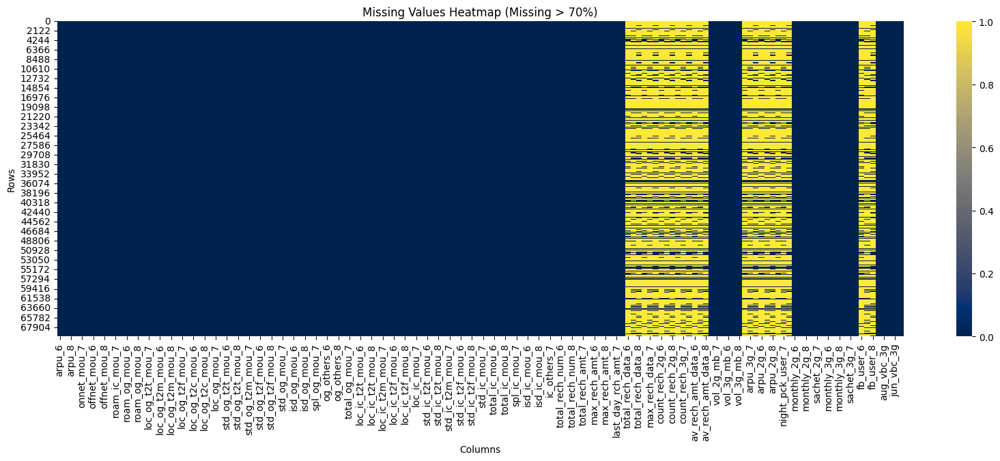

In [751]:
# Create a boolean mask for missing values greater than 70%
missing_values_mask = train.isna().sum() / len(train) > 0.7

# Create a heatmap of missing values greater than 70% with a different color palette
plt.figure(figsize=(20, 6))
sns.heatmap(train.isna() & missing_values_mask, cmap='cividis')
plt.title('Missing Values Heatmap (Missing > 70%)')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()


<font color='red ' size='4'><b>Observation:</b></font>
- **Grouping and treating missing values for 'recharge-related' data.**
- **Grouping and treating missing values for 'ARPU' data.**
- **Conducting missing value treatment on categorical columns.**


<font color='darkblue' size='4'><b>2.2.1 Handle Missing Value Recharge Related Columns</b></font>


In [752]:
# Columns with recharge information
recharge_cols = train.columns[train.columns.str.contains('_rech_')]
pd.DataFrame(recharge_cols, columns=['recharge-related'])

,recharge-related
0,total_rech_num_6
1,total_rech_num_7
2,total_rech_num_8
3,total_rech_amt_6
4,total_rech_amt_7
5,total_rech_amt_8
6,max_rech_amt_6
7,max_rech_amt_7
8,max_rech_amt_8
9,total_rech_data_6


In [753]:
# Replacing NaN values in recharge related columns with 0 in the training set
train[recharge_cols] = train[recharge_cols].fillna(0)
pd.DataFrame(train[recharge_cols].isnull().sum()*100/train.shape[1],columns=['NaN %'])

,NaN %
total_rech_num_6,0.0
total_rech_num_7,0.0
total_rech_num_8,0.0
total_rech_amt_6,0.0
total_rech_amt_7,0.0
total_rech_amt_8,0.0
max_rech_amt_6,0.0
max_rech_amt_7,0.0
max_rech_amt_8,0.0
total_rech_data_6,0.0


In [754]:
# Replacing NaN values in recharge related columns with 0 in the test set
unseen[recharge_cols] = unseen[recharge_cols].fillna(0)
pd.DataFrame(unseen[recharge_cols].isnull().sum()*100/unseen.shape[1], columns=['NaN %'])

,NaN %
total_rech_num_6,0.0
total_rech_num_7,0.0
total_rech_num_8,0.0
total_rech_amt_6,0.0
total_rech_amt_7,0.0
total_rech_amt_8,0.0
max_rech_amt_6,0.0
max_rech_amt_7,0.0
max_rech_amt_8,0.0
total_rech_data_6,0.0


<font color='darkblue' size='4'><b>2.2.2 Handle Missing Value ARPU (Average revenue per user) Columns</b></font>


In [755]:
# Columns with 'ARPU' information
arpu_cols = train.columns[train.columns.str.contains('arpu_')]
pd.DataFrame(arpu_cols, columns=['NaN %'])

,NaN %
0,arpu_6
1,arpu_7
2,arpu_8
3,arpu_3g_6
4,arpu_3g_7
5,arpu_3g_8
6,arpu_2g_6
7,arpu_2g_7
8,arpu_2g_8


In [756]:
# Replacing NaN values in ARPU related columns with 0 in the training set
train[arpu_cols] = train[arpu_cols].fillna(0)
pd.DataFrame(train[arpu_cols].isnull().sum()*100/train.shape[1], columns=['NaN %'])

,NaN %
arpu_6,0.0
arpu_7,0.0
arpu_8,0.0
arpu_3g_6,0.0
arpu_3g_7,0.0
arpu_3g_8,0.0
arpu_2g_6,0.0
arpu_2g_7,0.0
arpu_2g_8,0.0


In [757]:
# Replacing NaN values in ARPU related columns with 0 in the test set
unseen[arpu_cols] = unseen[arpu_cols].fillna(0)
print(unseen[arpu_cols].isnull().sum()*100/unseen.shape[1])

arpu_6       0.0
arpu_7       0.0
arpu_8       0.0
arpu_3g_6    0.0
arpu_3g_7    0.0
arpu_3g_8    0.0
arpu_2g_6    0.0
arpu_2g_7    0.0
arpu_2g_8    0.0
dtype: float64


<font color='darkblue' size='4'><b>2.2.3 Handle Missing Value Categorial Columns</b></font>


In [758]:
# Replacing NaN values in categorical related columns with -1 in the training set.
# We noticed that the columns listed in `cat_cols` are of the `float64` data type.
# We'll need to convert them to the `category` data type.
train[cat_cols] = train[cat_cols].fillna(-1).astype('category')
print(train[cat_cols].isnull().sum()*100/train.shape[1])

night_pck_user_6    0.0
night_pck_user_7    0.0
night_pck_user_8    0.0
fb_user_6           0.0
fb_user_7           0.0
fb_user_8           0.0
dtype: float64


In [759]:
# Inspecting categorical columns
train[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   night_pck_user_6  69999 non-null  category
 1   night_pck_user_7  69999 non-null  category
 2   night_pck_user_8  69999 non-null  category
 3   fb_user_6         69999 non-null  category
 4   fb_user_7         69999 non-null  category
 5   fb_user_8         69999 non-null  category
dtypes: category(6)
memory usage: 411.0 KB



<font color='red ' size='4'><b>Observation:</b></font>
- **Replacing NaN Values in Categorical Columns: The objection proposes replacing NaN values in categorical-related columns with -1 in the test set.**
- **Data Type Mismatch: It's observed that the columns listed in cat_cols are of the float64 data type, which should ideally be converted to the category data type to ensure consistency and accuracy in data representation.**






In [760]:
unseen[cat_cols] = unseen[cat_cols].fillna(-1).astype('category')
print(unseen[cat_cols].isnull().sum()*100/unseen.shape[1])

night_pck_user_6    0.0
night_pck_user_7    0.0
night_pck_user_8    0.0
fb_user_6           0.0
fb_user_7           0.0
fb_user_8           0.0
dtype: float64


In [761]:
# Verifying the change in dtype on the test set
unseen[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   night_pck_user_6  30000 non-null  category
 1   night_pck_user_7  30000 non-null  category
 2   night_pck_user_8  30000 non-null  category
 3   fb_user_6         30000 non-null  category
 4   fb_user_7         30000 non-null  category
 5   fb_user_8         30000 non-null  category
dtypes: category(6)
memory usage: 176.7 KB


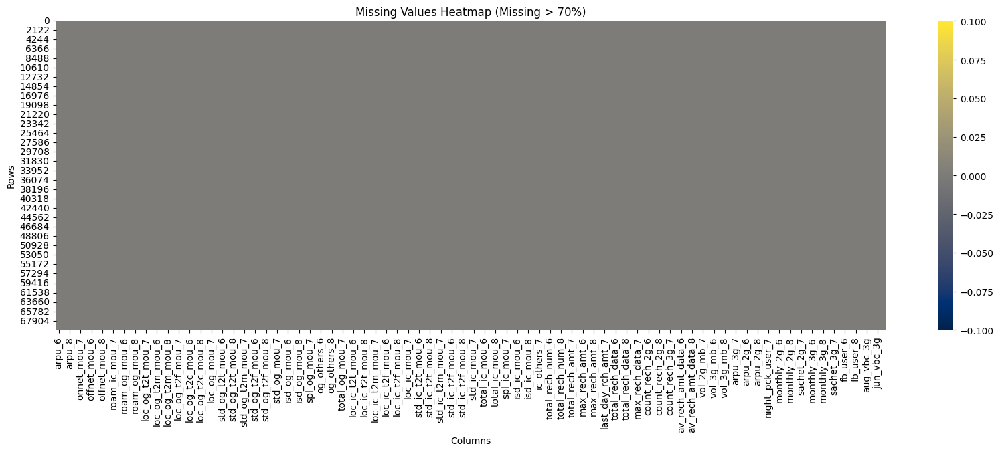

In [762]:
# Create a boolean mask for missing values greater than 70%
missing_values_mask = train.isna().sum() / len(train) > 0.7

# Create a heatmap of missing values greater than 70% with a different color palette
plt.figure(figsize=(20, 6))
sns.heatmap(train.isna() & missing_values_mask, cmap='cividis')
plt.title('Missing Values Heatmap (Missing > 70%)')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

In [763]:
# Checking for the columns which have missing values present
pd.DataFrame(mv_train_set[(mv_train_set > 0) & (mv_train_set <= 70)].sort_values(ascending=False),columns=['NaN %'])

,NaN %
ic_others_8,5.29
loc_og_t2m_mou_8,5.29
std_og_mou_8,5.29
spl_og_mou_8,5.29
std_og_t2f_mou_8,5.29
...,...
std_og_t2f_mou_7,3.84
og_others_7,3.84
std_og_mou_7,3.84
spl_og_mou_7,3.84


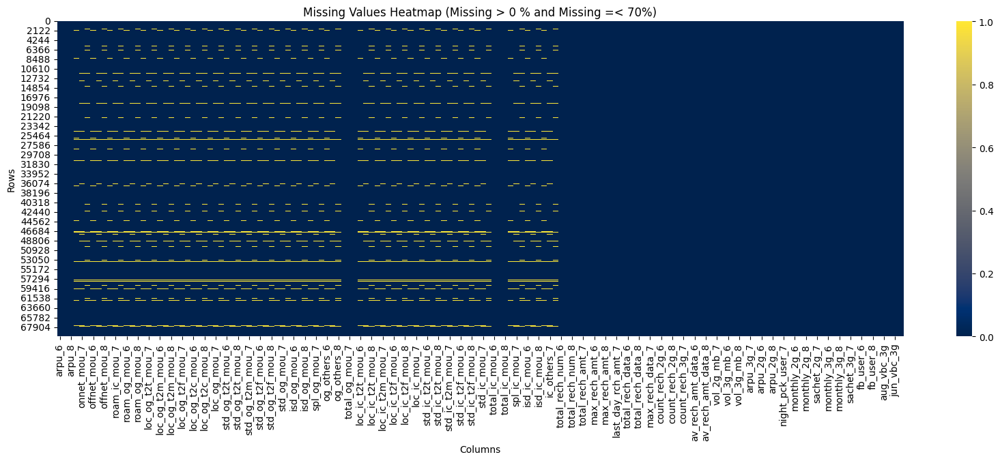

In [764]:
# Check for columns with missing values
missing_values_cols = train.isnull().sum()

# Filter columns with missing values between 0 and 70%
missing_values_mask = (missing_values_cols > 0) & (missing_values_cols <= 0.7 * len(train))

# Create a heatmap of missing values greater than 70% with a different color palette
plt.figure(figsize=(20, 6))
sns.heatmap(train.isna() & missing_values_mask, cmap='cividis')
plt.title('Missing Values Heatmap (Missing > 0 % and Missing =< 70%)')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()


In [765]:
# Creating a list containing these columns to be processed later for imputation using the KNN technique.
missing_values_list = mv_train_set[(mv_train_set > 0) & (mv_train_set <= 70)].index
print(missing_values_list)

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8',
       'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6',
       'og_others_7', 'og_others_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'lo

<font color='#A0153E' size='5'><b>2.3 Feture Extraction</b></font>

<font color='#850F8D' size='5'><b>Identifying High-Value Customers</b></font>
<p>We'll identify high-value customers aligning with our business objectives, focusing solely on prepaid customers experiencing usage-based churn. We'll evaluate the recharge amounts for June and July, selecting only the top 70% of customers as high-value.</p>


<font color='#850F8D' size='5'><b>Create New Features:</b></font>
<p><font color='darkblue' size='4'"><b>Total Data Recharge Amount:</b></p>
<p>This represents the total amount recharged by the customer for data usage.</p>
<pre><code>Total Data Recharge Amount = total_rech_data × av_rech_amt_data</code></pre>

<p><font color='darkblue' size='4'"><b>Total Amount:</b></p>
<p>This is the total recharge amount, including both data and other recharges, for the months of June and July.</p>
<pre><code>Total Amount = Total Data Recharge Amount + Total Recharge Amount</code></pre>

<p><font color='darkblue' size='4'"><b>Compute the Total Average Recharge Amount:</b></p>

<p>The Total Average Recharge Amount during the 'Good Phase' (June and July) can be calculated as follows:</p>
<pre><code>Total Average Amount = (Total Data Recharge Amount + Total Recharge Amount) / 2</code></pre>



In [766]:
# Deriving new columns for Total Data Recharge Amount for the 'Good Phase' in the training set
train['total_rech_data_amt_6'] = train['total_rech_data_6'] * train['av_rech_amt_data_6']
train['total_rech_data_amt_7'] = train['total_rech_data_7'] * train['av_rech_amt_data_7']

train['total_amt_6'] = train['total_rech_data_amt_6'] + train['total_rech_amt_6']
train['total_amt_7'] = train['total_rech_data_amt_7'] + train['total_rech_amt_7']

train['total_avg_amt_6_7'] = train[['total_amt_6', 'total_amt_7']].mean(axis=1)

In [767]:
# Dropping the columns as they are not so useful columns for high value customer or churn

drop_data_cols = ['total_rech_data_amt_6', 'total_rech_data_amt_7', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
                  'av_rech_amt_data_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',]

train.drop(drop_data_cols, axis=1, inplace=True)

In [768]:
# Deriving new columns for Total Data Recharge Amount for the 'Good Phase' in the test set
unseen['total_rech_data_amt_6'] = unseen['total_rech_data_6'] * unseen['av_rech_amt_data_6']
unseen['total_rech_data_amt_7'] = unseen['total_rech_data_7'] * unseen['av_rech_amt_data_7']

unseen['total_amt_6'] = unseen['total_rech_data_amt_6'] + unseen['total_rech_amt_6']
unseen['total_amt_7'] = unseen['total_rech_data_amt_7'] + unseen['total_rech_amt_7']

unseen['total_avg_amt_6_7'] = unseen[['total_amt_6', 'total_amt_7']].mean(axis=1)

# Dropping the drop_data_cols from the test set
unseen.drop(drop_data_cols, axis=1, inplace=True)

In [769]:
# Checking for any null value in the derived column in the training set
train['total_avg_amt_6_7'].isnull().sum()

0

In [770]:
train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,total_amt_6,total_amt_7,total_avg_amt_6_7
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,...,-1.0,-1.0,1958,0.0,0.0,0.0,0,77.0,65.0,71.0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,...,1.0,-1.0,710,0.0,0.0,0.0,0,0.0,290.0,145.0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,...,-1.0,-1.0,882,0.0,0.0,0.0,0,70.0,120.0,95.0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,...,-1.0,-1.0,982,0.0,0.0,0.0,0,160.0,240.0,200.0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,1.0,1.0,647,0.0,0.0,0.0,0,1515.0,1473.0,1494.0


In [771]:
train.shape

(69999, 149)

In [772]:
# Checking for any null value in the derived column in the test set
unseen['total_avg_amt_6_7'].isnull().sum()

0

In [773]:
unseen.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_amt_6,total_amt_7,total_avg_amt_6_7
0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,...,-1.0,-1.0,-1.0,1692,0.00,0.00,0.00,103.0,90.0,96.5
1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,...,-1.0,-1.0,-1.0,2533,0.00,0.00,0.00,500.0,500.0,500.0
2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,...,-1.0,-1.0,-1.0,277,525.61,758.41,241.84,500.0,1000.0,750.0
3,70002,43.550,171.390,24.400,5.31,2.16,0.00,40.04,205.01,24.01,...,-1.0,-1.0,-1.0,1244,0.00,0.00,0.00,110.0,260.0,185.0
4,70003,306.854,406.289,413.329,450.93,609.03,700.68,60.94,23.84,74.16,...,-1.0,-1.0,-1.0,462,0.00,0.00,0.00,356.0,490.0,423.0


In [774]:
unseen.shape

(30000, 149)



<font color='darkblue' size='4'><b>2.3.1 Top 70% of high value customers</b></font>


In [775]:
cutoff = train['total_avg_amt_6_7'].quantile(0.7)
cutoff

477.5

In [776]:
# Filter high value customers in the new dataframe (high_val_train) where total recharge is more than 477.5
high_val_train = train[(train['total_avg_amt_6_7'] > cutoff)].copy()

print(high_val_train.shape)

(20998, 149)



<font color='red ' size='4'><b>Observation:</b></font>
- **High value customers 20.99K**






<font color='#A0153E' size='5'><b>2.4 Analysing Target Variable</b></font>

In [777]:
# check data type of target variable
high_val_train['churn_probability'].dtype

dtype('int64')

In [778]:
# Changing data type int64 to category
high_val_train['churn_probability'] = high_val_train['churn_probability'].astype('category')

In [779]:
# Verify data type
high_val_train['churn_probability'].dtype

CategoricalDtype(categories=[0, 1], ordered=False)

In [780]:
# analysing churn and not-churn
high_val_train['churn_probability'].value_counts()

churn_probability
0    19263
1     1735
Name: count, dtype: int64

In [781]:
# analysing churn and not-churn
high_val_train['churn_probability'].value_counts()*100 /high_val_train.shape[0]

churn_probability
0    91.737308
1     8.262692
Name: count, dtype: float64

In [782]:
# Count the number of occurrences for each churn_probability value
churn_counts = high_val_train['churn_probability'].value_counts().reset_index()
churn_counts.columns = ['churn_probability', 'count']

# Create the bar plot using Plotly Express
fig = px.bar(
    churn_counts,
    x='churn_probability',
    y='count',
    title='Customer Churn Distribution',
    labels={'churn_probability': 'Customer Churn', 'count': 'Count'},
    width=700,
    height=700
)

# Update the layout to match the desired font sizes
fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=12,
    yaxis_title_font_size=12
)

# Show the plot
fig.show()

In [783]:
# Count the number of occurrences for each churn_probability value
# Create the pie plot using Plotly Express
fig_pie = px.pie(
    churn_counts,
    names='churn_probability',
    values='count',
    title='Customer Churn Distribution',
    color='churn_probability',
)

# Update the layout to match the desired font sizes
fig_pie.update_layout(
    title_font_size=18
)

# Show the pie plot
fig_pie.show()

<font color='red' size='4'><b>Observation:</b></font>
- **91.7% of customers are non-churned, while 8.3% of customers are churned.**


In [784]:
# Create a copy of high_val_train df and use the new df (churn_data) for pruning in the training set
churn_data = high_val_train.copy()
churn_data.reset_index(inplace=True)
churn_data.drop(['index'], axis=1, inplace=True)

In [785]:
churn_data.shape

(20998, 149)

In [786]:
# Get the list of columns with missing values in the training set
missing_value = round(100*(churn_data.isnull().sum(axis=0)/churn_data.shape[0]), 2)
s = missing_value.loc[missing_value>0]
impute_cols_num = list(s.index)
pd.DataFrame(impute_cols_num,columns=['Missing Value Columns'])

,Missing Value Columns
0,onnet_mou_6
1,onnet_mou_7
2,onnet_mou_8
3,offnet_mou_6
4,offnet_mou_7
...,...
76,isd_ic_mou_7
77,isd_ic_mou_8
78,ic_others_6
79,ic_others_7


In [787]:
# drop missing value
drop_missing_value =  high_val_train.dropna()
churn_data.shape[0] - drop_missing_value.shape[0]

1061

<font color='#A0153E' size='5'><b>2.5 Imputer Missing value using KNN</b></font>

<font color='darkblue' size='4'><b>2.5.1 Finding Hyperparameter Tunning For KNN Imputer</b></font>

In [788]:

# Create imputer instance
imputer = KNNImputer()

# Separate DataFrame having columns to be imputed
df_num = churn_data[impute_cols_num]
churn_df = churn_data.drop(impute_cols_num, axis=1)

# Define parameter grid for GridSearchCV
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance']
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=imputer, param_grid=param_grid, scoring='neg_mean_squared_error')

# Fit the GridSearchCV on the numerical data
grid_search.fit(df_num)

# Get the best parameters
best_params = grid_search.best_params_

# Print the best parameters
print("Best parameters:", best_params)

Best parameters: {'n_neighbors': 3, 'weights': 'uniform'}


<font color='red' size='4'><b>Observation:</b></font>
- **Best parameters: 'n_neighbors': 3, weights': 'uniform'**


<font color='darkblue' size='4'><b>2.5.2 Imputing Missing value using KNN Imputer - Traning Dataset</b></font>


In [789]:
# Imputing missing value
# Create imputer instance
imputer = KNNImputer(n_neighbors=3)

# Separate DataFrame having columns to be imputed
df = churn_data[impute_cols_num]
churn_df = churn_data.drop(impute_cols_num, axis=1)

# Impute using KNN imputer instance
df_imputer = imputer.fit_transform(df)

In [790]:
# Convert it to df post imputation
df_imputer = pd.DataFrame(df_imputer, columns=impute_cols_num)
df_imputer.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8
0,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
1,10.43,24.99,194.43,317.11,341.79,197.09,0.00,0.0,0.0,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
2,859.53,372.71,0.89,293.46,450.11,386.91,0.00,0.0,0.0,0.00,...,0.00,0.13,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.4
3,93.18,38.29,29.86,531.19,507.76,222.03,0.00,0.0,0.0,0.00,...,21.93,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
4,8.58,11.48,12.68,133.16,158.73,182.83,0.00,0.0,0.0,0.00,...,0.40,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0


In [791]:
# Merge the two dataframes together post imputation to create the final training set
final_df = pd.concat([df_imputer, churn_df], join='inner', axis=1)
final_df.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,total_amt_6,total_amt_7,total_avg_amt_6_7
0,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,...,1.0,1.0,647,0.0,0.00,0.00,0,1515.0,1473.0,1494.0
1,10.43,24.99,194.43,317.11,341.79,197.09,0.00,0.0,0.0,0.00,...,-1.0,1.0,602,0.0,0.00,0.00,0,808.0,400.0,604.0
2,859.53,372.71,0.89,293.46,450.11,386.91,0.00,0.0,0.0,0.00,...,-1.0,-1.0,455,0.0,0.00,0.00,0,1420.0,990.0,1205.0
3,93.18,38.29,29.86,531.19,507.76,222.03,0.00,0.0,0.0,0.00,...,0.0,0.0,1219,0.0,0.00,0.00,0,463.0,519.0,491.0
4,8.58,11.48,12.68,133.16,158.73,182.83,0.00,0.0,0.0,0.00,...,1.0,1.0,573,700.4,185.71,173.72,0,1385.0,1180.0,1282.5


In [792]:
final_df.shape

(20998, 149)

In [793]:
# Verify no missing value is present in the training set now
pd.DataFrame(final_df.isnull().sum().sort_values(ascending=False))

,0
onnet_mou_6,0
total_rech_amt_7,0
max_rech_amt_6,0
max_rech_amt_7,0
max_rech_amt_8,0
...,...
loc_ic_t2t_mou_8,0
loc_ic_t2m_mou_6,0
loc_ic_t2m_mou_7,0
loc_ic_t2m_mou_8,0


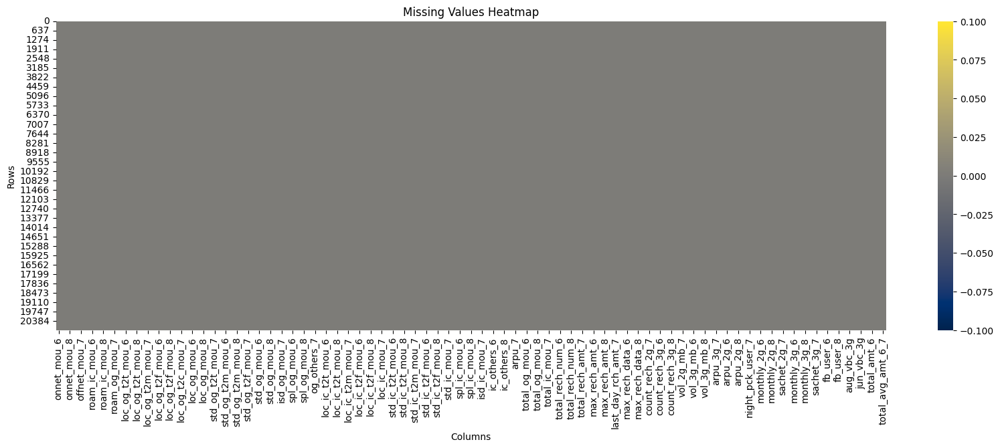

In [794]:
# Create a heatmap of missing values
plt.figure(figsize=(20, 6))
sns.heatmap(final_df.isna() ,cmap='cividis')
plt.title('Missing Values Heatmap')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

<font color='darkblue' size='4'><b>2.5.3 Imputing Missing value using KNN Imputer - Test Dataset</b></font>


In [795]:
# Separate df having columns to be imputed
df_num_unseen = unseen[impute_cols_num]
churn_df_unseen = unseen.drop(impute_cols_num, axis=1)

# Impute using KNN imputer instance
df_imputer_unseen = imputer.transform(df_num_unseen)

# Convert it to df post imputation
df_imputer_unseen = pd.DataFrame(df_imputer_unseen, columns=impute_cols_num)
df_imputer_unseen.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8
0,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,...,4.34,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00
1,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00
2,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00
3,5.31,2.16,0.00,40.04,205.01,24.01,0.00,0.00,0.00,0.00,...,8.83,0.00,0.00,0.00,0.00,1.43,8.65,0.0,0.0,0.00
4,450.93,609.03,700.68,60.94,23.84,74.16,0.00,0.00,0.00,0.00,...,141.48,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.16


In [796]:
# Merge the two dataframes together post imputation
final_unseen_df = pd.concat([df_imputer_unseen, churn_df_unseen], join='inner', axis=1)
final_unseen_df.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_amt_6,total_amt_7,total_avg_amt_6_7
0,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,...,-1.0,-1.0,-1.0,1692,0.00,0.00,0.00,103.0,90.0,96.5
1,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,...,-1.0,-1.0,-1.0,2533,0.00,0.00,0.00,500.0,500.0,500.0
2,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,...,-1.0,-1.0,-1.0,277,525.61,758.41,241.84,500.0,1000.0,750.0
3,5.31,2.16,0.00,40.04,205.01,24.01,0.00,0.00,0.00,0.00,...,-1.0,-1.0,-1.0,1244,0.00,0.00,0.00,110.0,260.0,185.0
4,450.93,609.03,700.68,60.94,23.84,74.16,0.00,0.00,0.00,0.00,...,-1.0,-1.0,-1.0,462,0.00,0.00,0.00,356.0,490.0,423.0


In [797]:
final_unseen_df.shape

(30000, 149)

In [798]:
pd.DataFrame(final_unseen_df.isnull().sum().sort_values(ascending=False))

,0
onnet_mou_6,0
total_rech_amt_6,0
total_rech_amt_8,0
max_rech_amt_6,0
max_rech_amt_7,0
...,...
loc_ic_t2t_mou_8,0
loc_ic_t2m_mou_6,0
loc_ic_t2m_mou_7,0
loc_ic_t2m_mou_8,0


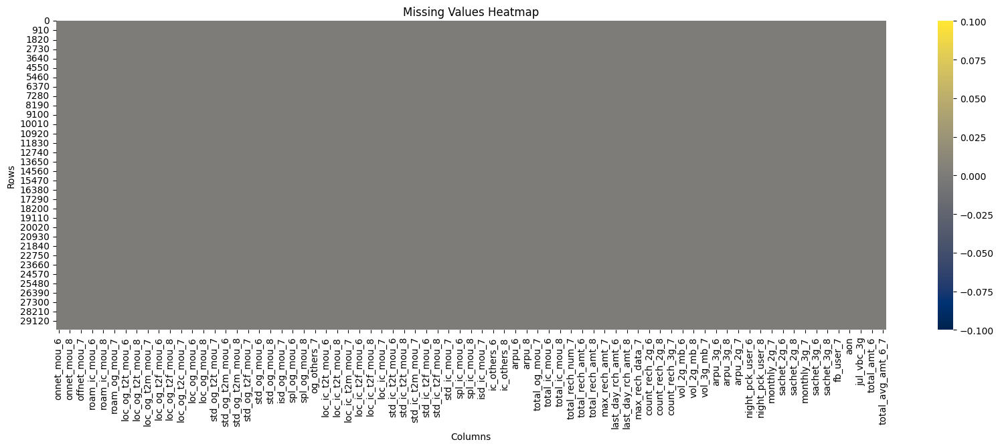

In [799]:
# Create a heatmap of missing values
plt.figure(figsize=(20, 6))
sns.heatmap(final_unseen_df.isna() ,cmap='cividis')
plt.title('Missing Values Heatmap')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

<font color='#A0153E' size='5'><b> 3. Common Mathod</b></font>

In [800]:
# Bar Plot Graph

def plot_bar_graph(title, months, y_list, data):
    # Create subplots
    fig = make_subplots(rows=1, cols=len(months), subplot_titles=[f'{title} for {m}' for m in months])

    for i, m in enumerate(months):
        fig.add_trace(
            go.Bar(x=data['churn_probability'], y=data[y_list[i]], name=f'{m}'),
            row=1, col=i+1
        )

    fig.update_layout(
        title_text=title,
        height=600, width=1500,
        showlegend=False,
        title_font_size=20
    )

    fig.show()

In [801]:
# Pie Plot Graph
def plot_pie_graph(title, months, y_list, data):
    # Create subplots for pie charts
    fig = make_subplots(
        rows=1,
        cols=len(months),
        specs=[[{'type': 'domain'} for _ in months]],
        subplot_titles=[f'{title} for {m}' for m in months]
    )

    colors = px.colors.qualitative.Plotly

    for i, m in enumerate(months):
        fig.add_trace(
            go.Pie(
                labels=data['churn_probability'],
                values=data[y_list[i]],
                name=f'{m}',
                marker=dict(colors=colors),
                hovertemplate='<b>%{label}</b><br>Value: %{value}<br>Percentage: %{percent}<extra></extra>'
            ),
            row=1, col=i+1
        )

    fig.update_layout(
        title_text=title,
        height=600, width=1500,
        title_font_size=20,
        showlegend=True,  # Display legend
        legend_title_text='Churn Probability'
    )

    fig.show()

In [802]:
def plot_hist_graph(df, title, max_columns=5):
    # Filter numerical columns
    numeric_columns = df.select_dtypes(include=['number']).columns

    # Calculate the number of rows needed
    num_plots = len(numeric_columns)
    num_rows = (num_plots + max_columns - 1) // max_columns

    for row in range(num_rows):
        plt.figure(figsize=(20, 5))

        for i in range(max_columns):
            idx = row * max_columns + i
            if idx >= num_plots:
                break
            column = numeric_columns[idx]

            plt.subplot(1, max_columns, i + 1)
            sns.histplot(df[column].dropna(), bins=20, kde=True, color='purple')
            plt.title(f'Histogram of {column}')


        plt.show()


In [803]:
def outlier_handling(dataframe):
    transformed_values = []
    for value in dataframe:
        if value <= 0:
            transformed_values.append(float(0))
        elif float(value) == float(1.0):
            transformed_values.append(float(1.5))
        else:
            transformed_values.append(float(np.log1p(value)))

    return transformed_values

In [804]:
def calculate_classification_metrics(y_true, y_pred):
    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    print('Confusion Matrix')
    print()
    print(cm)

    # True Positives, False Positives, True Negatives, False Negatives
    TP = cm[1, 1]
    FP = cm[0, 1]
    TN = cm[0, 0]
    FN = cm[1, 0]

    # Accuracy Score
    accuracy = round((TP + TN) / (TP + FP + TN + FN), 4)

    # Sensitivity (Recall or True Positive Rate)
    sensitivity = round(TP / (TP + FN), 4)

    # Specificity
    specificity = round(TN / (TN + FP), 4)

    # Precision
    precision = round(TP / (TP + FP), 4)

    # False Positive Rate
    false_positive_rate = round(FP / (FP + TN), 4)

    # True Positive Rate
    true_positive_rate = sensitivity

    metrics_df = pd.DataFrame({
        'Metric': ['Accuracy', 'Sensitivity', 'Specificity', 'Precision', 'False Positive Rate', 'True Positive Rate'],
        'Value': [accuracy, sensitivity, specificity, precision, false_positive_rate, true_positive_rate]
    })

    return metrics_df

<font color='#A0153E' size='5'><b>4. Exploratory Data Analysis(EDA) </b></font>



<font color='darkblue' size='4'><b>4.1. Visualising Average Revenue Per User </b></font>


In [805]:
arpu_cols = ['arpu_6', 'arpu_7', 'arpu_8']
plot_bar_graph('Avg. Revenue Per User', ['June', 'July', 'August'], arpu_cols, final_df)
plot_pie_graph('Avg. Revenue Per User', ['June', 'July', 'August'], arpu_cols, final_df)

<font color='red' size='4'><b>Observation:</b></font>
- **Average revenue per user in June: 92.9% churn and 7.08% non-churn**
- **Average revenue per user in July: 93.8% churn and 6.23% non-churn**
- **Average revenue per user in August: 93.3% churn and 3.69% non-churn**




<font color='darkblue' size='4'><b>4.2. Outgoing Minutes Of Usage</b></font>


In [806]:
outgoing_minutes = ['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']
plot_bar_graph('Total Outgoing Minutes', ['June', 'July', 'August'], outgoing_minutes, final_df)
plot_pie_graph('Total Outgoing Minutes', ['June', 'July', 'August'], outgoing_minutes, final_df)

<font color='red' size='4'><b>Observation:</b></font>
- **Total outgoing Minutes in June: 91% churn and 9.04% non-churn**
- **Total outgoing Minutes in July: 90.4% churn and 9.56% non-churn**
- **Total outgoing Minutes in August: 95.3% churn and 4.66% non-churn**




<font color='darkblue' size='4'><b>4.3. Incoming Minutes Of Usage</b></font>


In [807]:
incoming_minutes = ['total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8']
plot_bar_graph('Total Incoming Minutes', ['June', 'July', 'August'], incoming_minutes, final_df)
plot_pie_graph('Total Incoming Minutes', ['June', 'July', 'August'], incoming_minutes, final_df)

<font color='red' size='4'><b>Observation:</b></font>
- **Total incoming Minutes in June: 95.5% churn and 4.51% non-churn**
- **Total incoming Minutes in July: 97.2% churn and 2.82% non-churn**
- **Total incoming Minutes in August: 98.7% churn and 1.34% non-churn**




<font color='darkblue' size='4'><b>4.4. Call Within Operator's network</b></font>


In [808]:
within_operator_network = ['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']
plot_bar_graph('Total Call With In Network', ['June', 'July', 'August'], within_operator_network, final_df)
plot_pie_graph('Total Call With In Network', ['June', 'July', 'August'], within_operator_network, final_df)

<font color='red' size='4'><b>Observation:</b></font>
- **Total Call With In Network in June: 86.4% churn and 13.6% non-churn**
- **Total Call With In Network in July: 85.2% churn and 14.1% non-churn**
- **Total Call With In Network in August: 89.1% churn and 10.9% non-churn**




<font color='darkblue' size='4'><b>4.5. Call Made Outside Operator's Network</b></font>


In [809]:
outside_operator_network =['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']
plot_bar_graph('Total Call Outside Network', ['June', 'July', 'August'], outside_operator_network, final_df)
plot_pie_graph('Total Call Outside Network', ['June', 'July', 'August'], outside_operator_network, final_df)

<font color='red' size='4'><b>Observation:</b></font>
- **Total Call Outside Network in June: 93.7% churn and 6.29% non-churn**
- **Total Call Outside Network in July: 92.9% churn and 7.08% non-churn**
- **Total Call Outside Network in August: 96% churn and 4.04% non-churn**


In [810]:
# Analysing different metrics by extracting them into columns of similar type
amount_data = final_df.filter(like='amt')
data2g = final_df.filter(like='2g')
data3g = final_df.filter(like='3g')
ic_mou_data = final_df.filter(regex='ic.*mou')
net_mou_data = final_df.filter(like='net_mou')
og_mou_data = final_df.filter(regex='og.*mou')
rech_data = final_df.filter(like='rech')
total_data = final_df.filter(like='tot')



<font color='darkblue' size='4'><b>4.6. Visualize Total Rechange Amount</b></font>


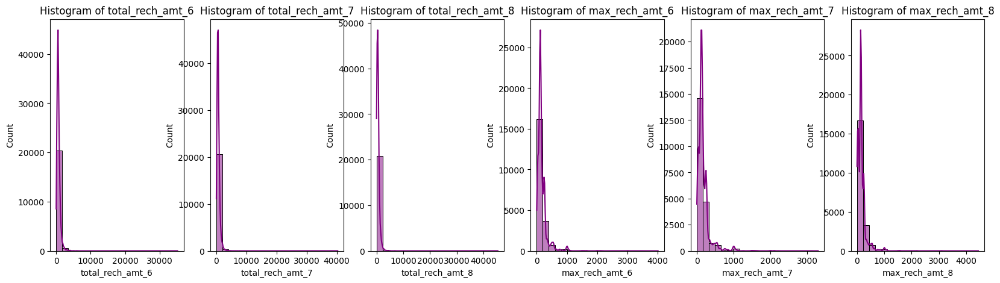

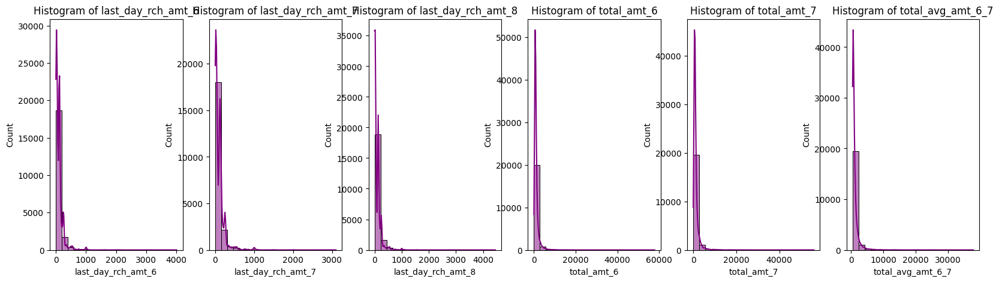

In [811]:
# Visualize amount_data
plot_hist_graph(amount_data, 'Amount Data',max_columns = 6)

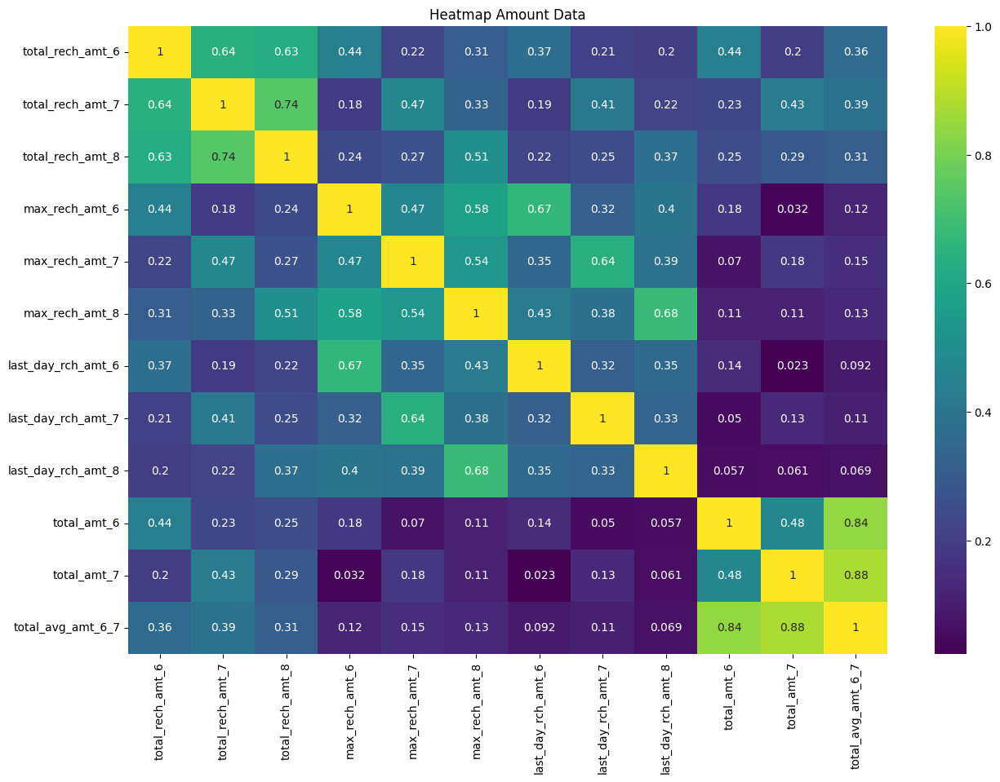

In [812]:
# Visualize Corr with Fetures
plt.figure(figsize=(15,10))
plt.title('Heatmap Amount Data')
sns.heatmap(amount_data.corr(), annot=True, cmap='viridis')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **Total amount of recharge in months 7 and 8**
- **This suggests that customers who are unlikely to churn tend to recharge higher amounts in month 8.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.7. Visualize usege of 2G Data</b></font>


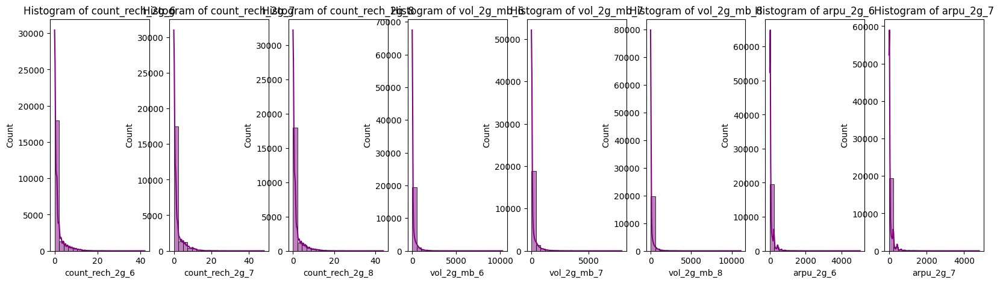

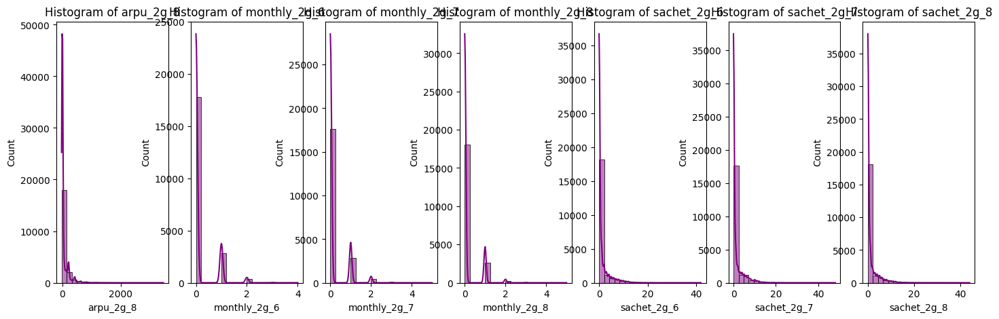

In [813]:
# Visualize data2g
plot_hist_graph(data2g, '2G Data',max_columns = 8)

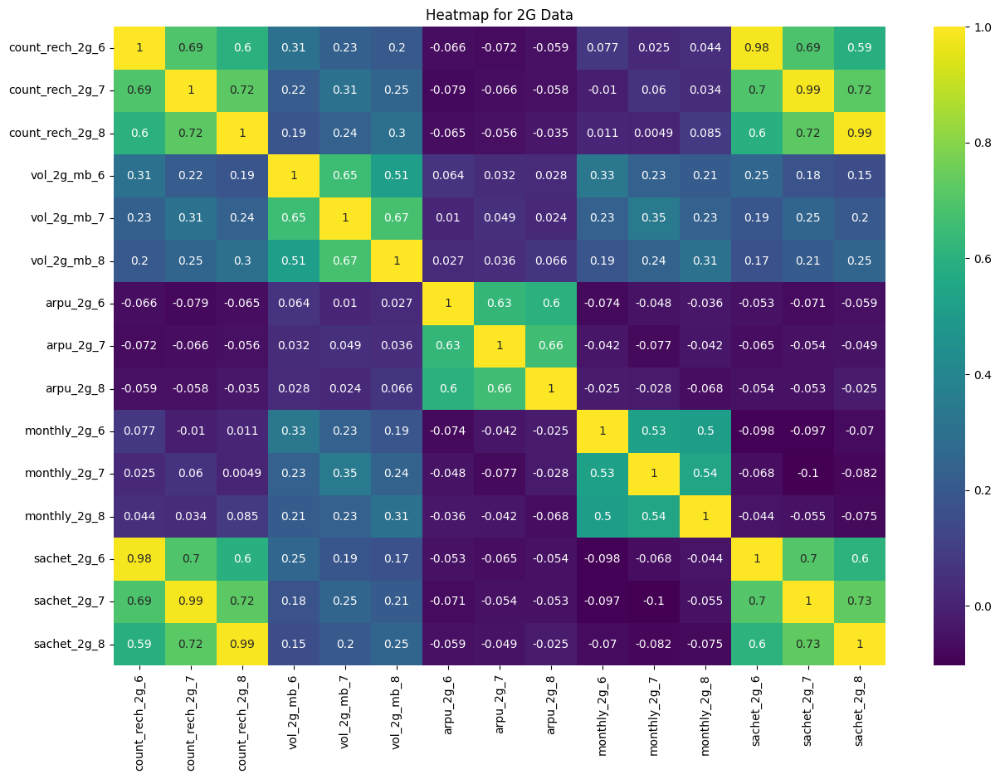

In [814]:
# Visualize Corr with Fetures
plt.figure(figsize=(15,10))
sns.heatmap(data2g.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for 2G Data')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **Strong correlation between recharge quantities in months 7 and 8.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.8. Visualize usege of 3G Data</b></font>


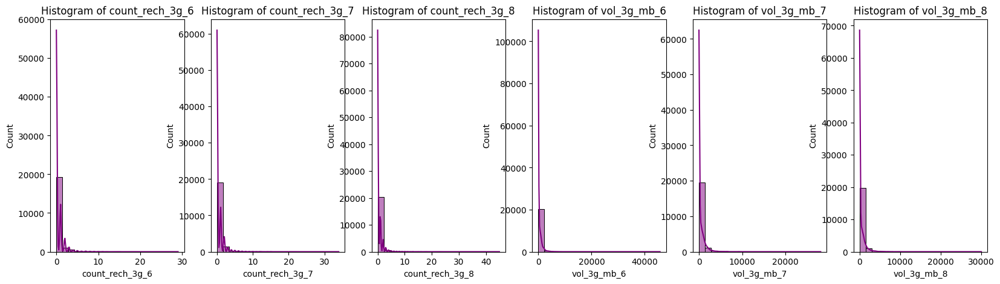

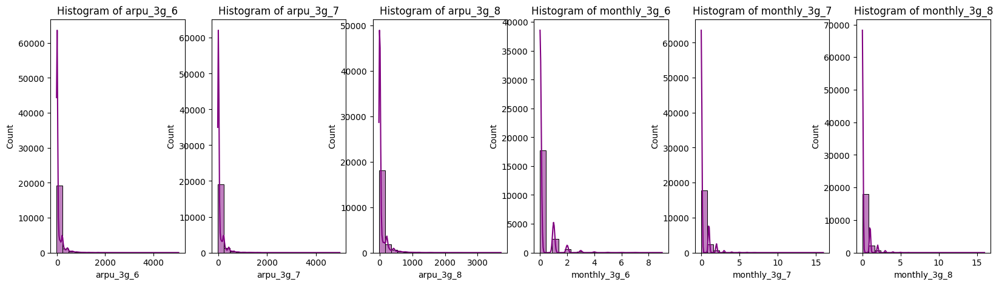

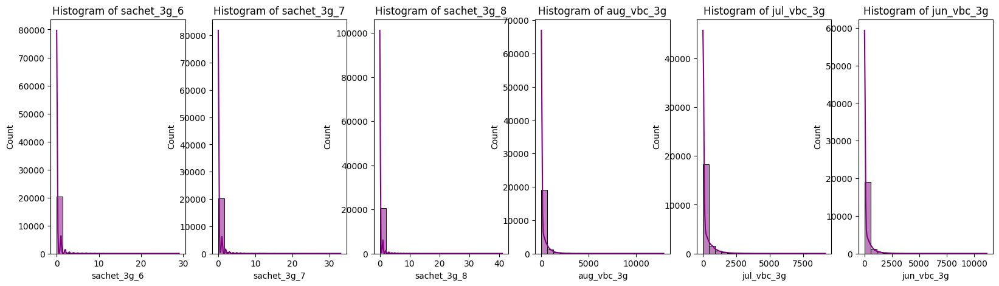

In [815]:
# Visualize data3g
plot_hist_graph(data3g, '3G Data',max_columns = 6)

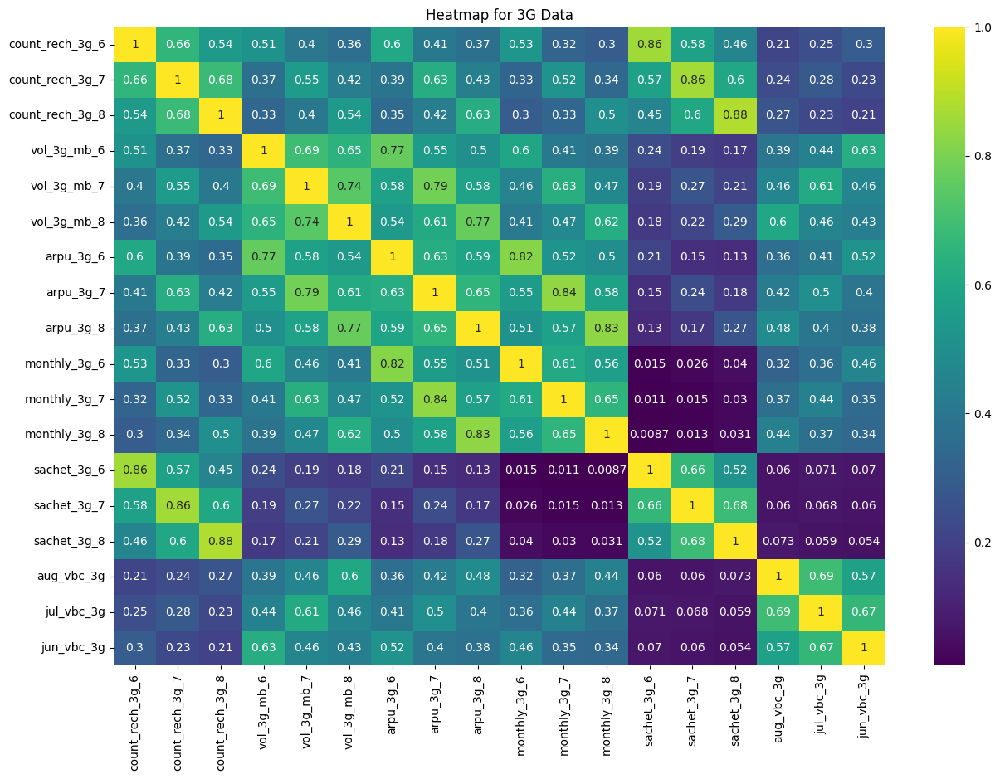

In [816]:
# Visualize Corr with Fetures
plt.figure(figsize=(15,10))
sns.heatmap(data3g.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for 3G Data')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **Strong correlation between recharge quantities in months 7 and 8.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.9. Visualize Incoming Calls</b></font>


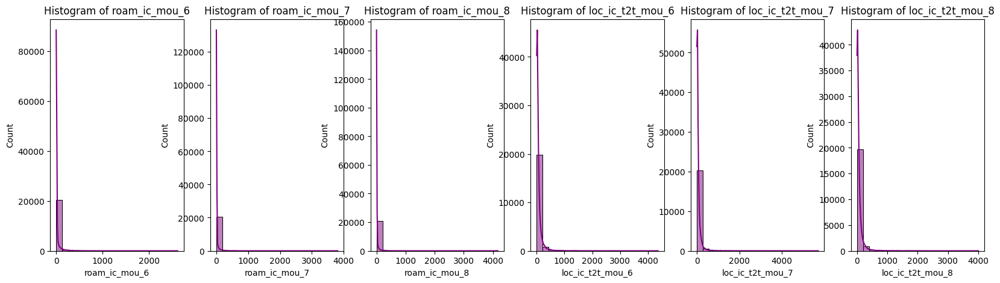

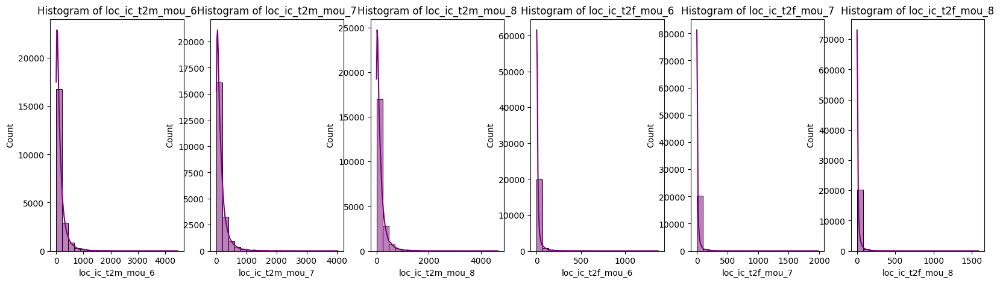

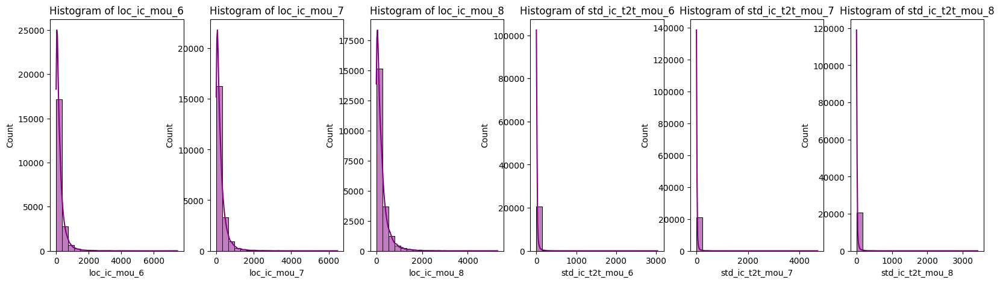

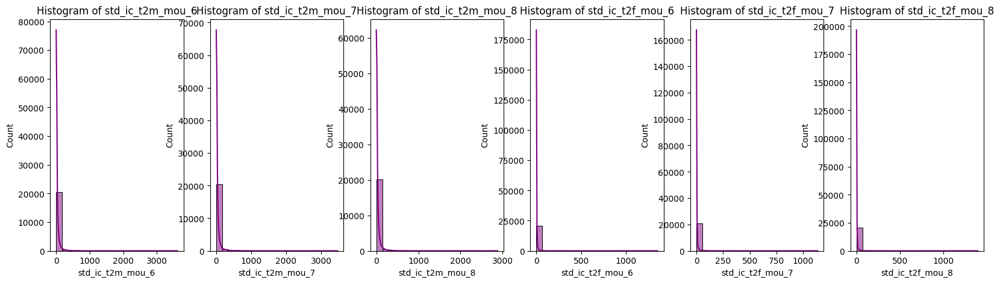

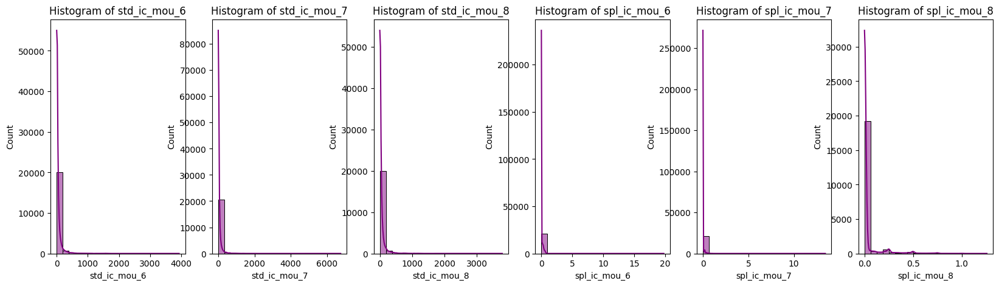

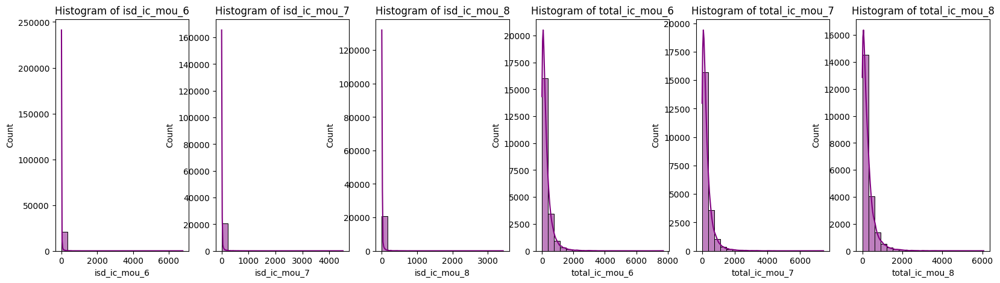

In [817]:
# Visualize ic_mou_data
plot_hist_graph(ic_mou_data, 'Incoming Calls In Month',max_columns = 6)

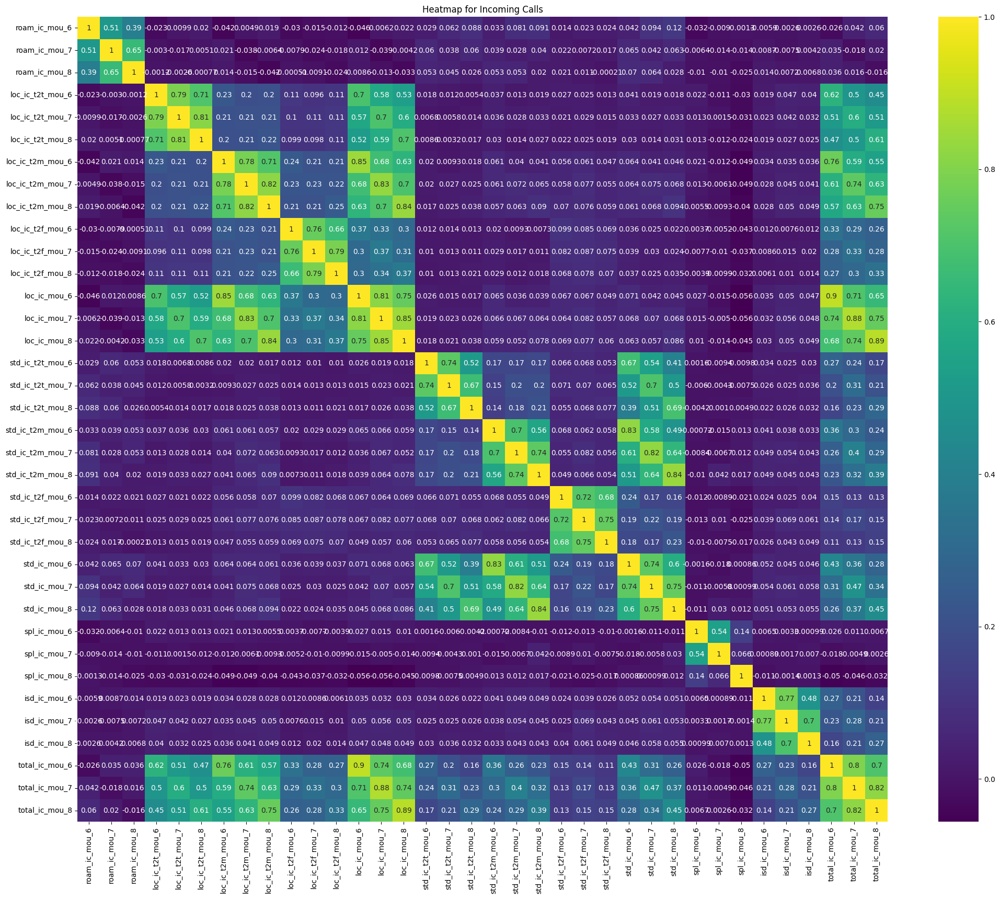

In [818]:
# Visualize Corr with Fetures
plt.figure(figsize=(25,20))
sns.heatmap(ic_mou_data.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for Incoming Calls')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **Strong correlation between Local calls within same telecom circle with local calls in month of 6,7 and 8.**
- **Strong correlation between STD calls outside the calling circle with std calls in month of 6,7 and 8.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.10. Visualize On & Off Network Usege</b></font>


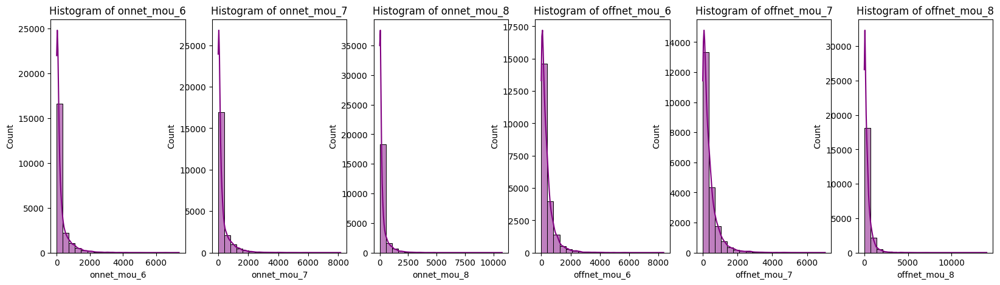

In [819]:
# Visualize  net_mou_data
plot_hist_graph(net_mou_data, ' On & Off Network',max_columns = 6)

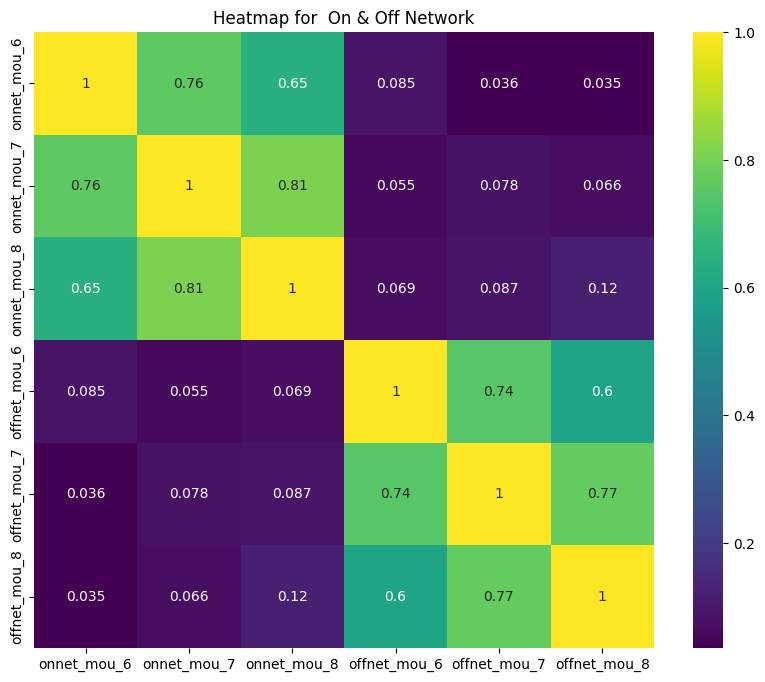

In [820]:
# Visualize Corr with Fetures
plt.figure(figsize=(10,8))
sns.heatmap(net_mou_data.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for  On & Off Network')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **There is no correlation between the usage minutes for on-net and off-net calls.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.11. Visualize Outgoing Calls Usege</b></font>


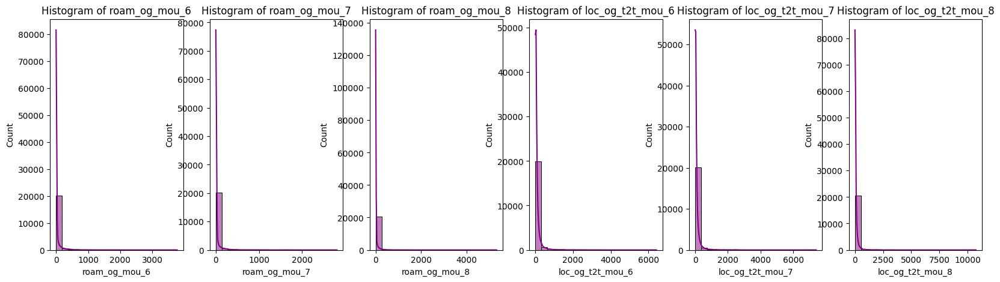

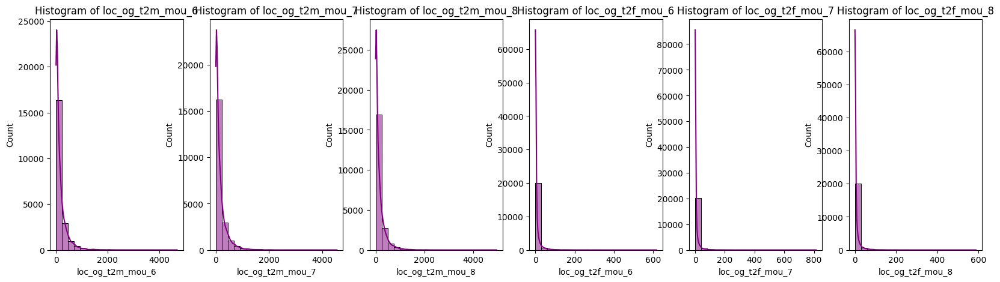

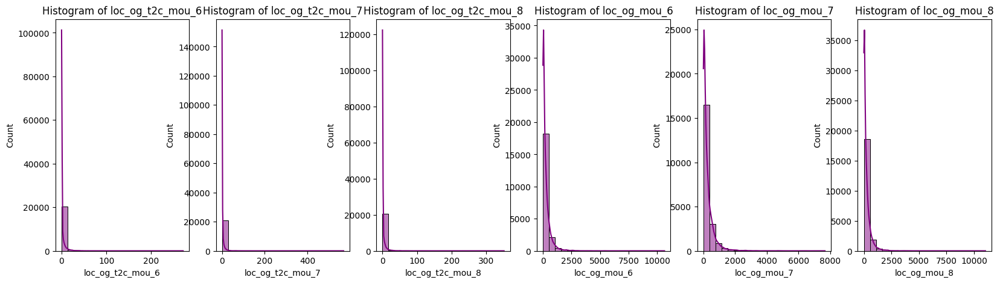

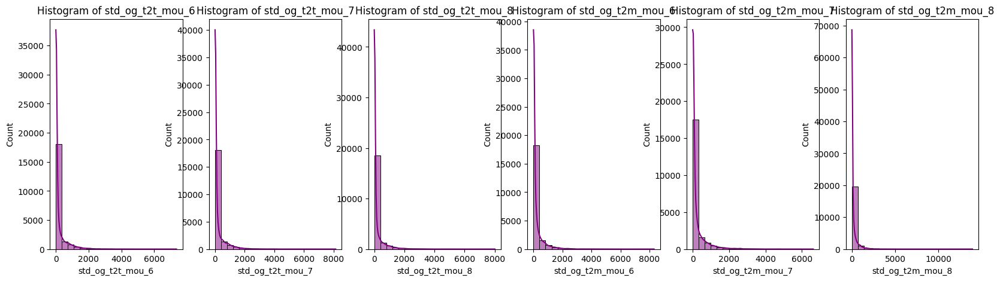

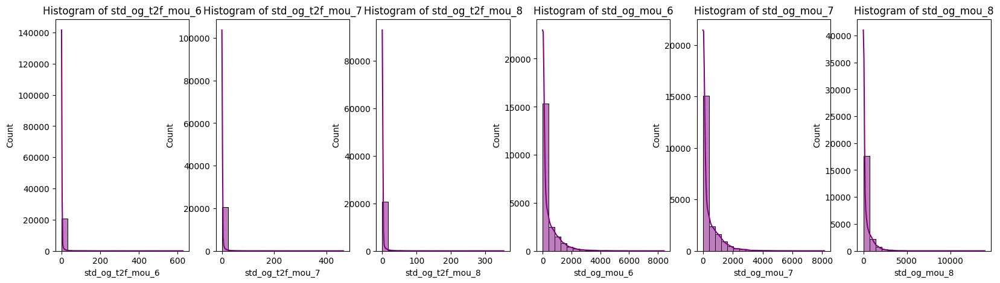

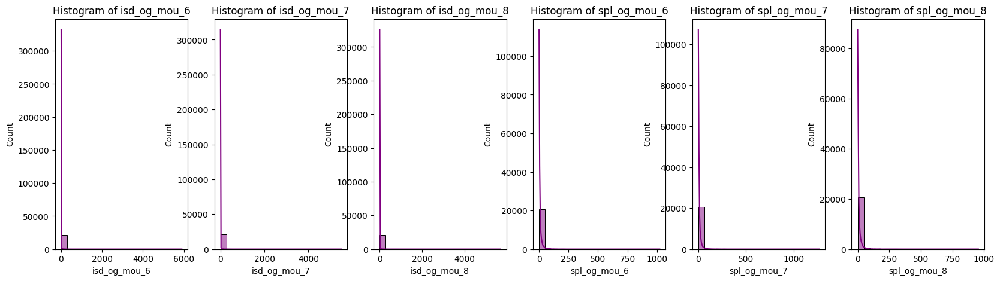

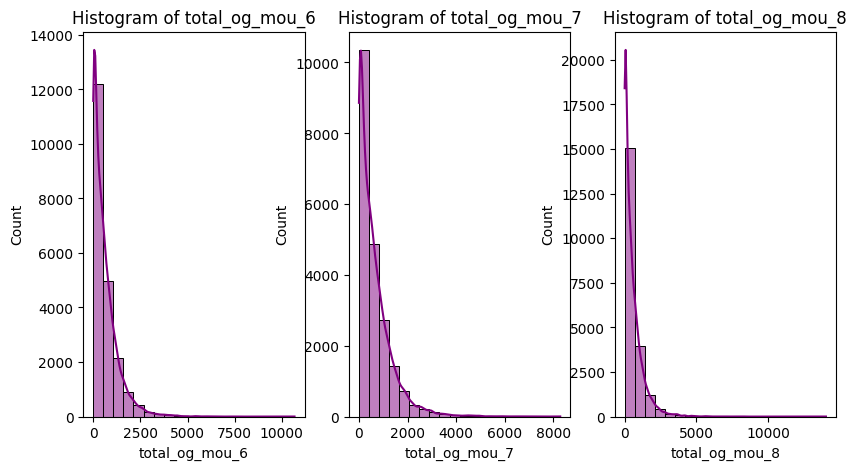

In [821]:
# Visualize og_mou_data
plot_hist_graph(og_mou_data, ' Outgoing Calls',max_columns = 6)

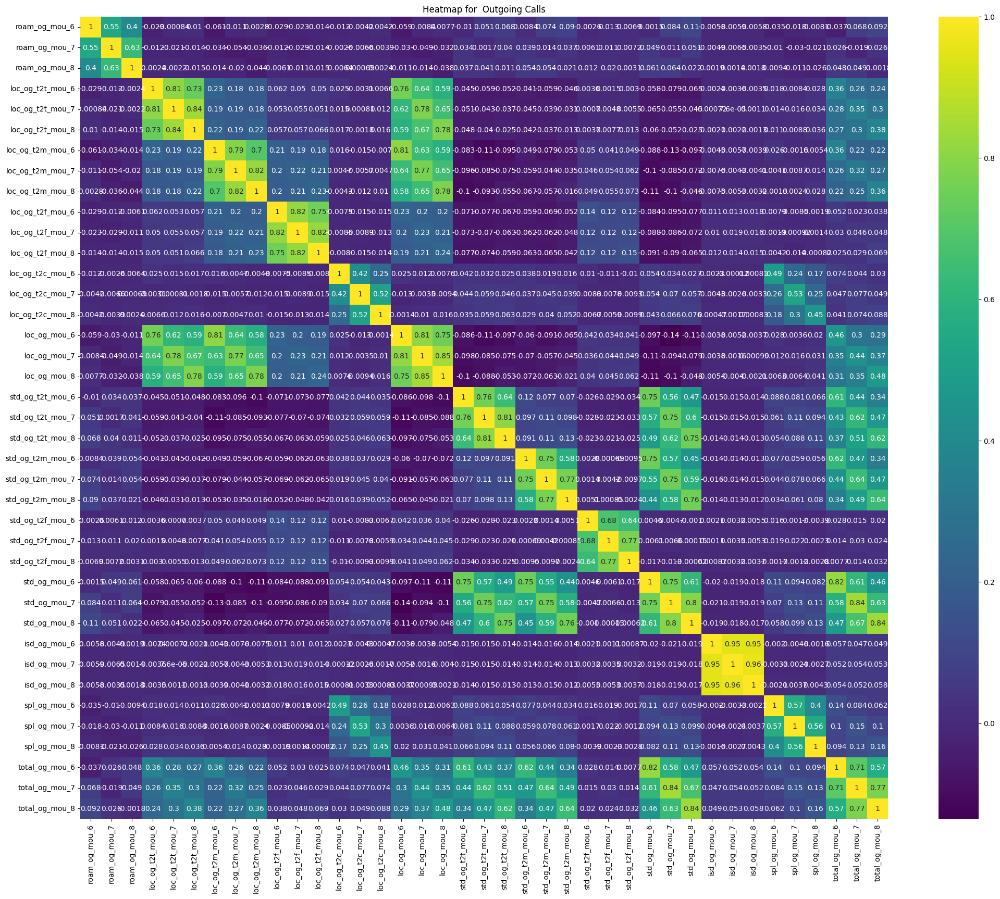

In [822]:
# Visualize Corr with Fetures
plt.figure(figsize=(25,20))
sns.heatmap(og_mou_data.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for  Outgoing Calls')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **Strong correlation between ISD out going call month 6,7,8**
- **Strong correlation between  total out going call and SID outgoing call  6,7,8**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.12. Visualize Rechage Data</b></font>


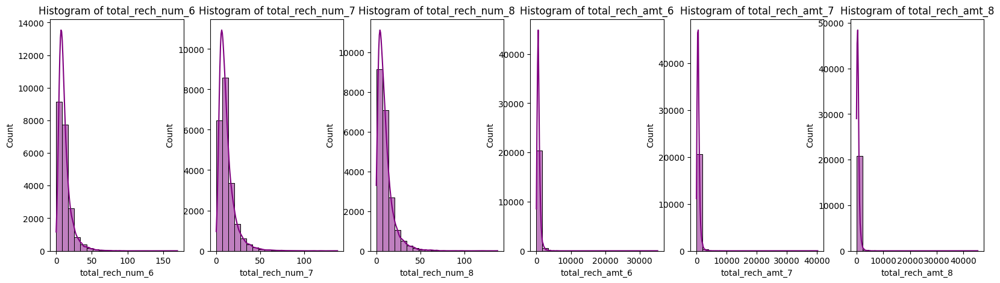

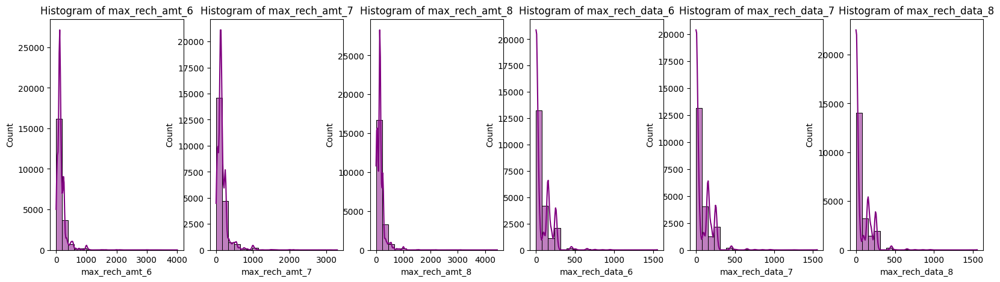

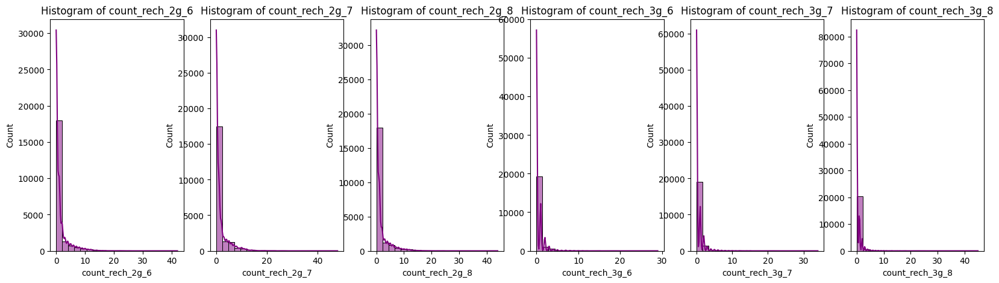

In [823]:
# Visualize rech_data
plot_hist_graph(rech_data, 'Recharge Data',max_columns = 6)

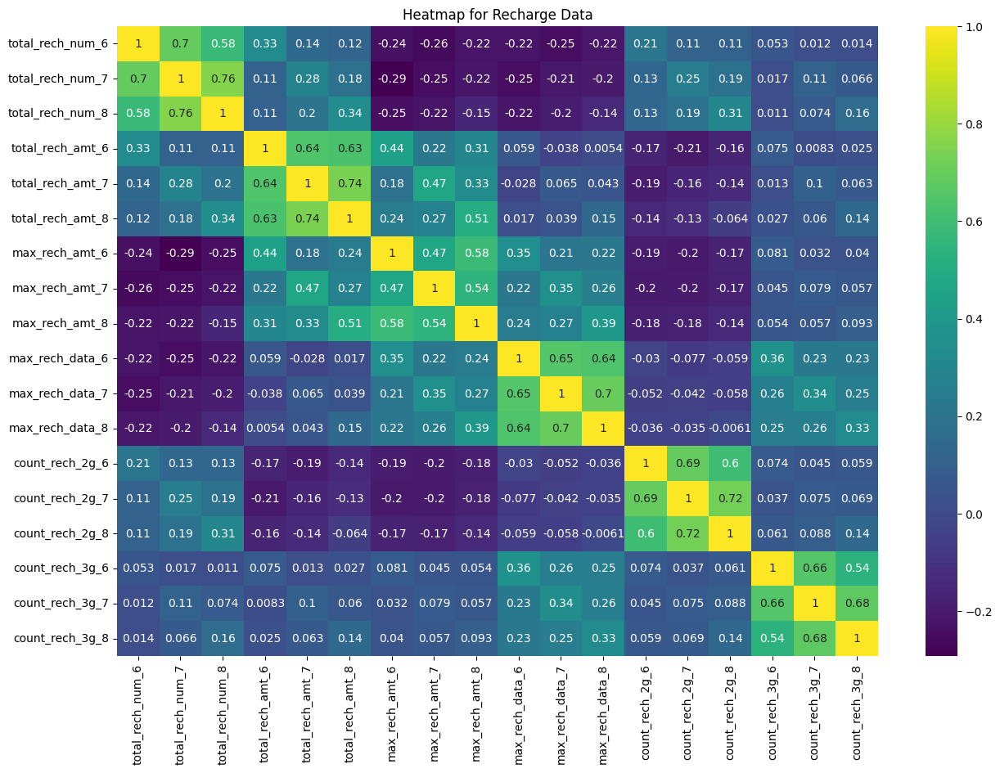

In [824]:
# Visualize Corr with Fetures
plt.figure(figsize=(15,10))
sns.heatmap(rech_data.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for Recharge Data')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **There is a notable correlation between the average recharge amount and the recharge amount for both months 6 and 7.**
- **Any factor correlated with month 8 is likely correlated with churn prediction.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**




<font color='darkblue' size='4'><b>4.13. Visualize Total Data Usge</b></font>


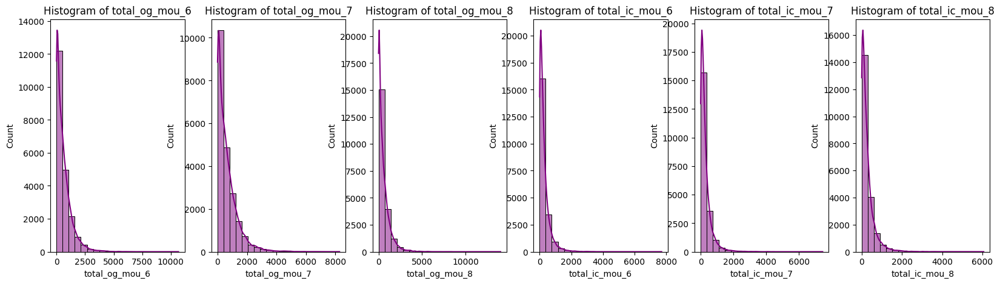

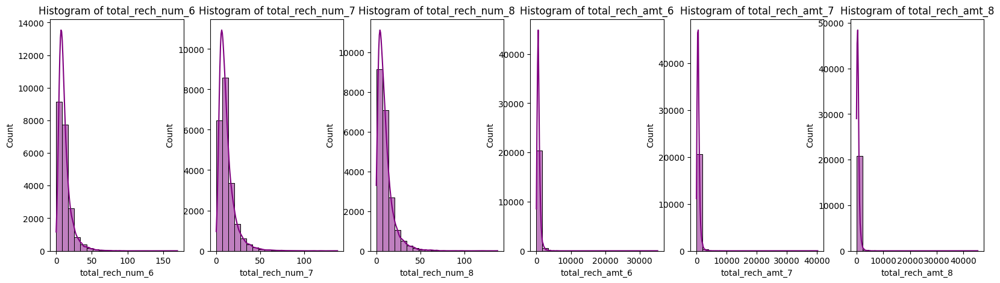

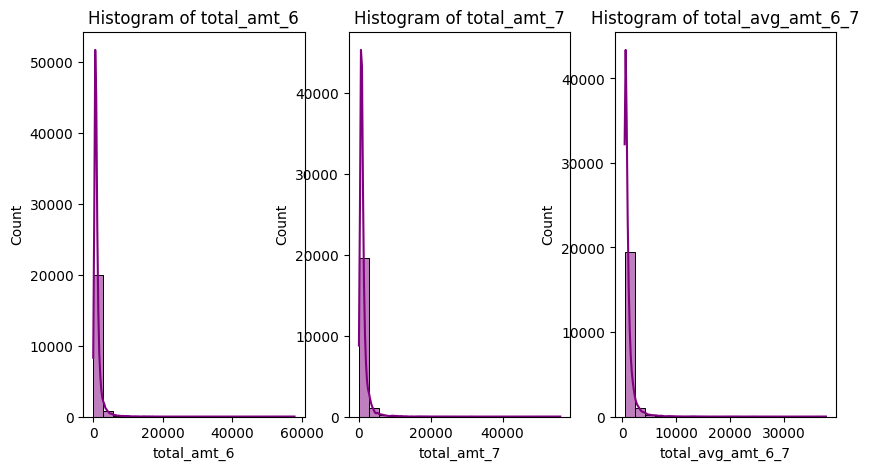

In [825]:
# Visualize total_data
plot_hist_graph(total_data, 'Total Data Usge',max_columns = 6)

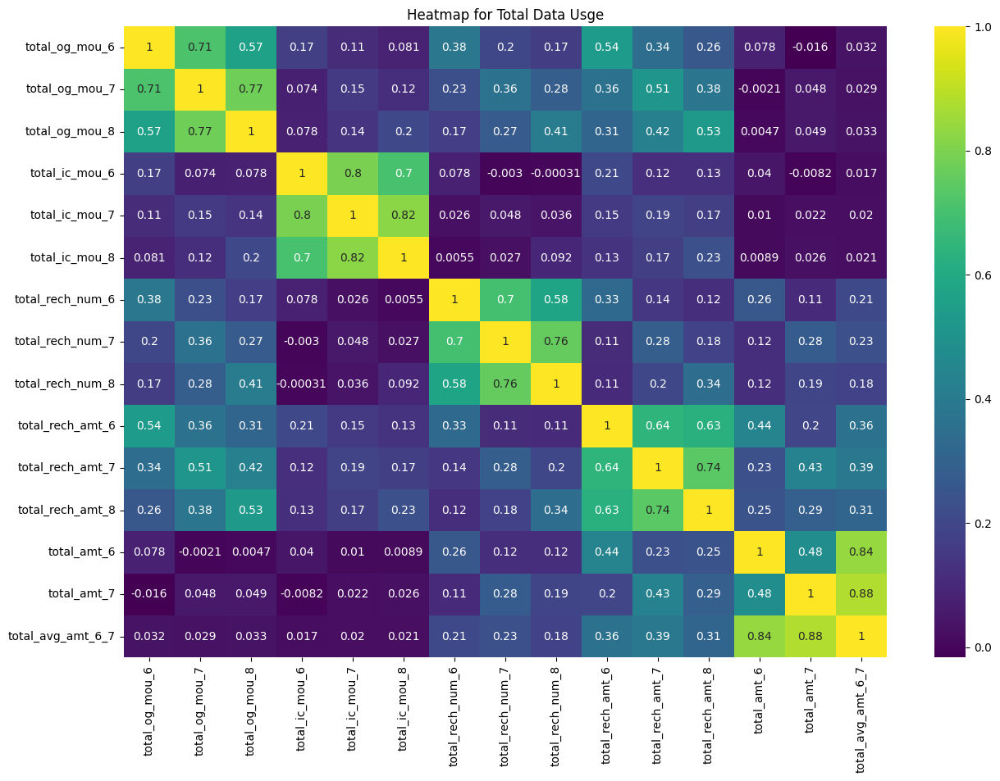

In [826]:
# Visualize Corr with Fetures
plt.figure(figsize=(15,10))
sns.heatmap(total_data.corr(), annot=True, cmap='viridis')
plt.title('Heatmap for Total Data Usge')
plt.show()

<font color='red' size='4'><b>Observation:</b></font>
- **There exists a remarkably high correlation between the incoming (82%) and outgoing minutes (77%) of usage in months 7 and 8.**
- **Heavy usage suggests that customers are less likely to churn.**
- **All features in the amount of recharge are not normally distributed and exhibit outliers**


<font color='#A0153E' size='5'><b>5. Feture Encoding </b></font>



<font color='darkblue' size='4'><b>5.1. One Hot Encoding - Traning Dataset</b></font>


In [827]:
# Creating dummies for categorical columns
dummy_df = pd.get_dummies(final_df[['night_pck_user_8', 'fb_user_8', 'fb_user_7', 'fb_user_6', 'night_pck_user_7', 'night_pck_user_6']], drop_first=True, dtype='int')

In [828]:
final_df = pd.concat([final_df, dummy_df], axis=1)

In [829]:
# drop the category cols
final_df.drop(['night_pck_user_8', 'fb_user_8', 'fb_user_7', 'fb_user_6', 'night_pck_user_7', 'night_pck_user_6'], axis=1, inplace=True)

In [830]:
final_df.shape

(20998, 155)

In [831]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20998 entries, 0 to 20997
Columns: 155 entries, onnet_mou_6 to night_pck_user_6_1.0
dtypes: category(1), float64(117), int64(37)
memory usage: 24.7 MB




<font color='darkblue' size='4'><b>5.2. One Hot Encoding - Test Dataset</b></font>


In [832]:
#Creating dummies for categorical columns
dummy_unseen_df = pd.get_dummies(final_unseen_df[['night_pck_user_8', 'fb_user_8', 'fb_user_7', 'fb_user_6', 'night_pck_user_7', 'night_pck_user_6']], drop_first=True, dtype='int')

In [833]:
final_unseen_df = pd.concat([final_unseen_df, dummy_unseen_df], axis=1)

In [834]:
# drop the category cols
final_unseen_df.drop(['night_pck_user_8', 'fb_user_8', 'fb_user_7', 'fb_user_6', 'night_pck_user_7', 'night_pck_user_6'], axis=1, inplace=True)

In [835]:
final_unseen_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Columns: 155 entries, onnet_mou_6 to night_pck_user_6_1.0
dtypes: float64(117), int64(38)
memory usage: 35.5 MB


In [836]:
final_unseen_df.shape

(30000, 155)

<font color='#A0153E' size='5'><b>6. Outlier Treatment</b></font>



<font color='darkblue' size='4'><b>6.1. Outlier Treatment - Train Dataset</b></font>


In [837]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
final_df.describe(percentiles=[.25, .50, .75, .90, .95, .99])

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,fb_user_8_0.0,fb_user_8_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_6_0.0,fb_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_6_0.0,night_pck_user_6_1.0
count,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,...,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000
mean,267.063679,272.166178,240.893826,382.382986,383.206289,344.556990,16.372065,13.050018,12.490094,27.891911,...,0.055624,0.476617,0.043433,0.523955,0.039670,0.516811,0.554339,0.013049,0.543290,0.013192
std,465.849834,487.219934,465.902198,480.872926,490.988358,476.176974,77.641615,77.932957,72.975563,120.414120,...,0.229200,0.499465,0.203834,0.499438,0.195188,0.499729,0.497050,0.113487,0.498134,0.114098
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.295000,17.880000,13.695000,79.460000,75.657500,57.648333,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,90.030000,87.560000,72.610000,234.560000,228.800000,198.285000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000
75%,292.227500,290.207500,245.880000,495.320000,498.762500,444.377500,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000
90%,766.564000,788.574000,673.013000,912.248000,922.828000,839.087000,27.966000,14.680000,15.733000,52.569000,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000
95%,1147.427500,1194.762500,1088.344500,1265.446000,1276.251500,1171.892500,86.637500,57.000500,56.219000,152.972000,...,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000
99%,2166.629000,2241.485700,2160.352700,2347.642300,2394.084300,2185.434000,334.806500,286.210700,276.339000,546.030900,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [838]:
numerical_cols = list(final_df.select_dtypes(exclude='category'))
# Handle outliers of numerical columns in the training set
final_df[numerical_cols] = final_df[numerical_cols].apply(outlier_handling)

In [839]:
# Inspecting the numerical columns again in the training set
final_df.describe(percentiles=[.25, .50, .75, .90, .95, .99])

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,fb_user_8_0.0,fb_user_8_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_6_0.0,fb_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_6_0.0,night_pck_user_6_1.0
count,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,...,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000,20998.000000
mean,4.207420,4.185039,3.995069,5.092442,5.068104,4.862815,0.711926,0.565315,0.590712,0.832508,...,0.083437,0.714925,0.065149,0.785932,0.059506,0.775217,0.831508,0.019573,0.814935,0.019788
std,2.019604,2.046673,2.070110,1.677505,1.703218,1.810846,1.514213,1.366508,1.367591,1.726409,...,0.343800,0.749197,0.305751,0.749157,0.292783,0.749594,0.745576,0.170230,0.747201,0.171147
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.010374,2.938103,2.687507,4.387760,4.339347,4.071559,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.511189,4.483680,4.298781,5.461966,5.437209,5.294736,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.500000,0.000000,1.500000,1.500000,0.000000,1.500000,0.000000
75%,5.680949,5.674036,5.508902,6.207221,6.214133,6.098922,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.500000,0.000000,1.500000,0.000000,1.500000,1.500000,0.000000,1.500000,0.000000
90%,6.643222,6.671494,6.513249,6.817007,6.828526,6.733505,3.366123,2.752386,2.817383,3.980971,...,0.000000,1.500000,0.000000,1.500000,0.000000,1.500000,1.500000,0.000000,1.500000,0.000000
95%,7.046149,7.086539,6.993331,7.143970,7.152466,7.067228,4.473209,4.060452,4.046885,5.036771,...,1.500000,1.500000,0.000000,1.500000,0.000000,1.500000,1.500000,0.000000,1.500000,0.000000
99%,7.681389,7.715340,7.678490,7.761593,7.781174,7.690027,5.816535,5.660216,5.625241,6.304505,...,1.500000,1.500000,1.500000,1.500000,1.500000,1.500000,1.500000,1.500000,1.500000,1.500000




<font color='darkblue' size='4'><b>6.2. Outlier Treatment - Test Dataset</b></font>


In [840]:
# Handle outliers of numerical columns in the test set
final_unseen_df[numerical_cols] = final_unseen_df[numerical_cols].apply(outlier_handling)

In [841]:
# Inspecting the numerical columns again in the test set
final_unseen_df.describe(percentiles=[.25, .50, .75, .90, .95, .99])

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,fb_user_8_0.0,fb_user_8_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_6_0.0,fb_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_6_0.0,night_pck_user_6_1.0
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.00000,30000.000000,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,3.450085,3.396584,3.374337,4.366048,4.319229,4.288815,0.567759,0.431202,0.443434,0.664756,...,0.04280,0.353300,0.03585,0.349450,0.034150,0.345100,0.377350,0.007950,0.369900,0.009350
std,1.923993,1.948758,1.949863,1.644706,1.668630,1.686637,1.291185,1.123123,1.148587,1.454542,...,0.24974,0.636508,0.22911,0.634092,0.223742,0.631323,0.650881,0.108914,0.646559,0.118059
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.155245,2.059239,2.016235,3.593882,3.513335,3.472277,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.630985,3.545298,3.536311,4.610357,4.548282,4.548282,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.843084,4.822215,4.815654,5.496717,5.461424,5.451875,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,1.500000,0.000000,0.000000,0.000000
90%,5.877542,5.868602,5.845022,6.168028,6.176813,6.176331,2.800933,2.138889,2.214846,3.360811,...,0.00000,1.500000,0.00000,1.500000,0.000000,1.500000,1.500000,0.000000,1.500000,0.000000
95%,6.432318,6.438602,6.421868,6.593607,6.610751,6.580333,3.713816,3.161402,3.291401,4.252950,...,0.00000,1.500000,0.00000,1.500000,0.000000,1.500000,1.500000,0.000000,1.500000,0.000000
99%,7.251171,7.295780,7.296181,7.331659,7.352257,7.323826,5.379389,5.045232,5.110086,5.650966,...,1.50000,1.500000,1.50000,1.500000,1.500000,1.500000,1.500000,0.000000,1.500000,0.000000


<font color='#A0153E' size='5'><b>7. Spliting Dataset In Train & Test</b></font>

In [842]:
# Partitioning the dataset into the feature variable 'X' and the response variable 'y'.
X = final_df.drop(['churn_probability'], axis=1)
y = final_df['churn_probability']

In [843]:
print("Dimension of X ", X.shape)
print("Dimension of y", y.shape)

Dimension of X  (20998, 154)
Dimension of y (20998,)


In [844]:
# Train test split - 80% training data, 20% validation data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [845]:
# Checking the shape after split
print('X_train Shape:', X_train.shape)
print('y_train Shape:', y_train.shape)
print('X_test Shape:', X_test.shape)
print('y_test Shape:', y_test.shape)

X_train Shape: (16798, 154)
y_train Shape: (16798,)
X_test Shape: (4200, 154)
y_test Shape: (4200,)


<font color='#A0153E' size='5'><b>8. Finding Hyperparameter For PCA And SMOTE</b></font>

<font color='darkblue' size='4'><b>8.1.Finding Hyperparameter For PCA</b></font>


In [846]:
# Define the parameter grid
param_grid = {
    'n_components': [10, 20, 30, 40, 50],
}

In [847]:
# Initialize PCA
pca = PCA()

In [848]:
# Initialize GridSearchCV with PCA
pca_search = GridSearchCV(pca, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)

In [849]:
# Fit the model using GridSearchCV
pca_search.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=PCA(), n_jobs=-1,
             param_grid={'n_components': [10, 20, 30, 40, 50]},
             scoring='accuracy', verbose=1)

In [850]:
# Get the best parameters
pca_best_params = pca_search.best_params_
# Print the best parameters
print(f"Best parameters found: {pca_best_params}")

Best parameters found: {'n_components': 10}


<font color='darkblue' size='4'><b>8.1.Finding Hyperparameter For SMOTE</b></font>


In [851]:
# Define the parameter grid for SMOTE
param_grid = {
    'k_neighbors': [3, 5, 7, 10],
}

In [852]:
smote = SMOTE()
smote_search = GridSearchCV(estimator=smote, param_grid=param_grid, cv=5,  scoring='accuracy', n_jobs=-1, verbose=1)

In [853]:
# Fit the model using GridSearchCV
smote_search.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5, estimator=SMOTE(), n_jobs=-1,
             param_grid={'k_neighbors': [3, 5, 7, 10]}, scoring='accuracy',
             verbose=1)

In [854]:
# Get the best parameters
smote_best_params = smote_search.best_params_
# Print the best parameters
print(f"Best parameters found: {smote_best_params}")

Best parameters found: {'k_neighbors': 3}



<font color='#A0153E' size='5'><b>9.Model Building and Evaluation</b></font>



<font color='darkblue' size='4'><b>7.1.Logistic Regression</b></font>


In [855]:
# Define the pipeline
lr_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('smote', SMOTE(k_neighbors=smote_best_params['k_neighbors'])),
    ('logisticregression', LogisticRegression(max_iter=1000, tol=0.001, random_state=42, solver='liblinear'))
])

In [856]:
# Fit the model with updated parameters
lr_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('smote', SMOTE(k_neighbors=3)),
                ('logisticregression',
                 LogisticRegression(max_iter=1000, random_state=42,
                                    solver='liblinear', tol=0.001))])

In [857]:
# Predict values on the training set
y_train_pred = lr_pipe.predict(X_train)

In [858]:
# Predict values on the validation set
y_test_pred = lr_pipe.predict(X_test)

In [859]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[13272  2120]
 [  315  1091]]


,Metric,Value
0,Accuracy,0.8550
1,Sensitivity,0.7760
2,Specificity,0.8623
3,Precision,0.3398
4,False Positive Rate,0.1377
5,True Positive Rate,0.7760


In [860]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3354  517]
 [  79  250]]


,Metric,Value
0,Accuracy,0.8581
1,Sensitivity,0.7599
2,Specificity,0.8664
3,Precision,0.3259
4,False Positive Rate,0.1336
5,True Positive Rate,0.7599




<font color='darkblue' size='4'><b>7.2. Support Vector Machine Classifier (SVM)</b></font>


In [861]:

# Define the pipeline
svc_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('smote', SMOTE(k_neighbors=smote_best_params['k_neighbors'])),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('svc', SVC())
])

In [862]:
# Fit the model with updated parameters
svc_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('smote', SMOTE(k_neighbors=3)), ('scaler', StandardScaler()),
                ('pca', PCA(n_components=10)), ('svc', SVC())])

In [863]:
# Predict values on the training set
y_train_pred = svc_pipe.predict(X_train)

In [864]:
# Predict values on the validation set
y_test_pred = svc_pipe.predict(X_test)

In [865]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[13559  1833]
 [  223  1183]]


,Metric,Value
0,Accuracy,0.8776
1,Sensitivity,0.8414
2,Specificity,0.8809
3,Precision,0.3922
4,False Positive Rate,0.1191
5,True Positive Rate,0.8414


In [866]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3423  448]
 [  71  258]]


,Metric,Value
0,Accuracy,0.8764
1,Sensitivity,0.7842
2,Specificity,0.8843
3,Precision,0.3654
4,False Positive Rate,0.1157
5,True Positive Rate,0.7842




<font color='darkblue' size='4'><b>7.3.Decision Tree Classifier</b></font>


In [867]:
# Define the pipeline
dt_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('smote', SMOTE(k_neighbors=smote_best_params['k_neighbors'])),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('decision_tree', DecisionTreeClassifier(random_state=42, max_depth=50, min_samples_split=2, min_samples_leaf=2))
])

In [868]:
# Fit the model with updated parameters
dt_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('smote', SMOTE(k_neighbors=3)), ('scaler', StandardScaler()),
                ('pca', PCA(n_components=10)),
                ('decision_tree',
                 DecisionTreeClassifier(max_depth=50, min_samples_leaf=2,
                                        random_state=42))])

In [869]:
# Predict values on the training set
y_train_pred = dt_pipe.predict(X_train)

In [870]:
# Predict values on the validation set
y_test_pred = dt_pipe.predict(X_test)

In [871]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[15321    71]
 [   78  1328]]


,Metric,Value
0,Accuracy,0.9911
1,Sensitivity,0.9445
2,Specificity,0.9954
3,Precision,0.9492
4,False Positive Rate,0.0046
5,True Positive Rate,0.9445


In [872]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3470  401]
 [ 155  174]]


,Metric,Value
0,Accuracy,0.8676
1,Sensitivity,0.5289
2,Specificity,0.8964
3,Precision,0.3026
4,False Positive Rate,0.1036
5,True Positive Rate,0.5289




<font color='darkblue' size='4'><b>7.4.Random Forest Classifier</b></font>


In [873]:
rf_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('random_forest', RandomForestClassifier(random_state=42))
])

In [874]:
# Fit the model with updated parameters
rf_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('random_forest', RandomForestClassifier(random_state=42))])

In [875]:
# Predict values on the training set
y_train_pred = rf_pipe.predict(X_train)

In [876]:
# Predict values on the validation set
y_test_pred = rf_pipe.predict(X_test)

In [877]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[15392     0]
 [   18  1388]]


,Metric,Value
0,Accuracy,0.9989
1,Sensitivity,0.9872
2,Specificity,1.0000
3,Precision,1.0000
4,False Positive Rate,0.0000
5,True Positive Rate,0.9872


In [878]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3820   51]
 [ 209  120]]


,Metric,Value
0,Accuracy,0.9381
1,Sensitivity,0.3647
2,Specificity,0.9868
3,Precision,0.7018
4,False Positive Rate,0.0132
5,True Positive Rate,0.3647




<font color='darkblue' size='4'><b>7.5. AdaBoost Classifier</b></font>


In [879]:
adb_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('adaboost', AdaBoostClassifier())
])

In [880]:
# Fit the model with updated parameters
adb_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('adaboost', AdaBoostClassifier())])

In [881]:
# Predict values on the training set
y_train_pred = adb_pipe.predict(X_train)

In [882]:
# Predict values on the validation set
y_test_pred = adb_pipe.predict(X_test)

In [883]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[15074   318]
 [  896   510]]


,Metric,Value
0,Accuracy,0.9277
1,Sensitivity,0.3627
2,Specificity,0.9793
3,Precision,0.6159
4,False Positive Rate,0.0207
5,True Positive Rate,0.3627


In [884]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3800   71]
 [ 206  123]]


,Metric,Value
0,Accuracy,0.9340
1,Sensitivity,0.3739
2,Specificity,0.9817
3,Precision,0.6340
4,False Positive Rate,0.0183
5,True Positive Rate,0.3739





<font color='darkblue' size='4'><b>7.6.XGBoost Classifier</b></font>


In [735]:
# Create the pipeline
xg_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
])

In [885]:
xg_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [886]:
# Predict values on the training set
y_train_pred = xg_pipe.predict(X_train)

In [887]:
# Predict values on the validation set
y_test_pred = xg_pipe.predict(X_test)

In [888]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[15386     6]
 [  180  1226]]


,Metric,Value
0,Accuracy,0.9889
1,Sensitivity,0.8720
2,Specificity,0.9996
3,Precision,0.9951
4,False Positive Rate,0.0004
5,True Positive Rate,0.8720


In [889]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3794   77]
 [ 198  131]]


,Metric,Value
0,Accuracy,0.9345
1,Sensitivity,0.3982
2,Specificity,0.9801
3,Precision,0.6298
4,False Positive Rate,0.0199
5,True Positive Rate,0.3982


<font color='red' size='6'><b>Final Observation:</b></font>
<ul>
    <li><b>Training Metrics</b></li>
    <table border="1">
        <tr>
            <th>Model</th>
            <th>Accuracy</th>
            <th>Sensitivity</th>
            <th>Specificity</th>
            <th>Precision</th>
            <th>False Positive Rate</th>
            <th>True Positive Rate</th>
        </tr>
        <tr>
            <td>Logistic Regression</td>
            <td>0.8557</td>
            <td>0.7732</td>
            <td>0.8632</td>
            <td>0.3391</td>
            <td>0.1368</td>
            <td>0.7732</td>
        </tr>
        <tr>
            <td>SVM</td>
            <td>0.8736</td>
            <td>0.8512</td>
            <td>0.8756</td>
            <td>0.3833</td>
            <td>0.1244</td>
            <td>0.8512</td>
        </tr>
        <tr>
            <td>Decision Tree</td>
            <td>0.9830</td>
            <td>0.8169</td>
            <td>0.9981</td>
            <td>0.9752</td>
            <td>0.0019</td>
            <td>0.8169</td>
        </tr>
        <tr>
            <td>Random Forest</td>
            <td>0.9988</td>
            <td>0.9857</td>
            <td>1.0000</td>
            <td>1.0000</td>
            <td>0.0000</td>
            <td>0.9857</td>
        </tr>
        <tr>
            <td>AdaBoost</td>
            <td>0.8471</td>
            <td>0.7854</td>
            <td>0.8527</td>
            <td>0.3261</td>
            <td>0.1473</td>
            <td>0.7854</td>
        </tr>
        <tr>
            <td>XGBoost</td>
            <td>0.9881</td>
            <td>0.8684</td>
            <td>0.9990</td>
            <td>0.9870</td>
            <td>0.0010</td>
            <td>0.8684</td>
        </tr>
    </table>
 </ul>
 <ul>   
    <li><b>Testing Metrics</b></li>
    <table border="1">
        <tr>
            <th>Model</th>
            <th>Accuracy</th>
            <th>Sensitivity</th>
            <th>Specificity</th>
            <th>Precision</th>
            <th>False Positive Rate</th>
            <th>True Positive Rate</th>
        </tr>
        <tr>
            <td>Logistic Regression</td>
            <td>0.8540</td>
            <td>0.7745</td>
            <td>0.8610</td>
            <td>0.3271</td>
            <td>0.1390</td>
            <td>0.7745</td>
        </tr>
        <tr>
            <td>SVM</td>
            <td>0.8595</td>
            <td>0.7864</td>
            <td>0.8659</td>
            <td>0.3384</td>
            <td>0.1341</td>
            <td>0.7864</td>
        </tr>
        <tr>
            <td>Decision Tree</td>
            <td>0.9093</td>
            <td>0.3234</td>
            <td>0.9604</td>
            <td>0.4160</td>
            <td>0.0396</td>
            <td>0.3234</td>
        </tr>
        <tr>
            <td>Random Forest</td>
            <td>0.9319</td>
            <td>0.3116</td>
            <td>0.9860</td>
            <td>0.6604</td>
            <td>0.0140</td>
            <td>0.3116</td>
        </tr>
        <tr>
            <td>AdaBoost</td>
            <td>0.8438</td>
            <td>0.7715</td>
            <td>0.8501</td>
            <td>0.3099</td>
            <td>0.1499</td>
            <td>0.7715</td>
        </tr>
        <tr>
            <td>XGBoost</td>
            <td>0.9310</td>
            <td>0.3501</td>
            <td>0.9798</td>
            <td>0.6020</td>
            <td>0.0202</td>
            <td>0.3501</td>
        </tr>
    </table>
 </ul>



<font color='#A0153E' size='5'><b>10. Final Model Building and Evaluation</b></font>




<font color='darkblue' size='4'><b>10.1.XGBoost Classifier</b></font>


In [890]:
xg_param_grid = {
    'xgb__n_estimators': [50, 100, 200],
    'xgb__learning_rate': [0.01, 0.1, 0.3],
    'xgb__max_depth': [3, 5, 7, 10],
    'xgb__min_child_weight': [1, 3, 5],
    'xgb__gamma': [0, 0.1, 0.3],
    'xgb__subsample': [0.7, 0.8, 1.0],
    'xgb__colsample_bytree': [0.7, 0.8, 1.0],
}


In [891]:
# Create the pipeline
final_xg_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
])

In [892]:
# Instantiate GridSearchCV
xg_grid_search = RandomizedSearchCV(final_xg_pipe, xg_param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)

In [893]:
# Fit GridSearchCV to find the best parameters
xg_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('imputer',
                                              SimpleImputer(fill_value=0,
                                                            strategy='constant')),
                                             ('scaler', StandardScaler()),
                                             ('pca', PCA(n_components=10)),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            device=None,
                                                            early_stopping_rounds=None,
                                                            enable_categ...
                                                            n_estimators=None,
                                                            n_jobs=None,
                                                            num_parallel_tree=None,
                                                            random_state=None, ...))]),
                   n_jobs=-1,
                   param_distributions={'xgb__colsample_bytree': [0.7, 0.8,
                                                                  1.0],
                                        'xgb__gamma': [0, 0.1, 0.3],
                                        'xgb__learning_rate': [0.01, 0.1, 0.3],
                                        'xgb__max_depth': [3, 5, 7, 10],
                                        'xgb__min_child_weight': [1, 3, 5],
                                        'xgb__n_estimators': [50, 100, 200],
                                        'xgb__subsample': [0.7, 0.8, 1.0]},
                   scoring='accuracy', verbose=1)

In [894]:
# Fit the model with updated parameters
xg_pipe.set_params(**xg_grid_search.best_params_)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.8, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, gamma=0.1, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None, min_child_weight=5,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=200,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=None, ...))])

In [895]:
final_xg_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [896]:

# Predict values on the training set
y_train_pred = final_xg_pipe.predict(X_train)

In [897]:
# Predict values on the validation set
y_test_pred = final_xg_pipe.predict(X_test)

In [898]:

# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[15378    14]
 [  181  1225]]


,Metric,Value
0,Accuracy,0.9884
1,Sensitivity,0.8713
2,Specificity,0.9991
3,Precision,0.9887
4,False Positive Rate,0.0009
5,True Positive Rate,0.8713


In [899]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3788   83]
 [ 201  128]]


,Metric,Value
0,Accuracy,0.9324
1,Sensitivity,0.3891
2,Specificity,0.9786
3,Precision,0.6066
4,False Positive Rate,0.0214
5,True Positive Rate,0.3891




<font color='darkblue' size='4'><b>10.1.Random Forest Classifier</b></font>


In [900]:
rf_param_grid = {
    'random_forest__n_estimators': [100, 300, 500],
    'random_forest__criterion': ['gini', 'entropy'],
    'random_forest__max_depth': [None, 10, 20, 30, 40],
    'random_forest__min_samples_split': [2, 5, 10],
    'random_forest__min_samples_leaf': [1, 2, 4],
    'random_forest__max_features': ['auto', 'sqrt', 'log2']
}

In [901]:
final_rf_pipe = ImbPipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_best_params['n_components'])),
    ('random_forest', RandomForestClassifier(random_state=42))
])

In [902]:
# Instantiate GridSearchCV
rf_grid_search = RandomizedSearchCV(final_rf_pipe, rf_param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)

In [724]:
# Fit the model using GridSearchCV
rf_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('imputer',
                                              SimpleImputer(fill_value=0,
                                                            strategy='constant')),
                                             ('scaler', StandardScaler()),
                                             ('pca', PCA(n_components=10)),
                                             ('random_forest',
                                              RandomForestClassifier(random_state=42))]),
                   n_jobs=-1,
                   param_distributions={'random_forest__criterion': ['gini',
                                                                     'entropy'],
                                        'random_forest__max_depth': [None, 10,
                                                                     20, 30,
                                                                     40],
                                        'random_forest__max_features': ['auto',
                                                                        'sqrt',
                                                                        'log2'],
                                        'random_forest__min_samples_leaf': [1,
                                                                            2,
                                                                            4],
                                        'random_forest__min_samples_split': [2,
                                                                             5,
                                                                             10],
                                        'random_forest__n_estimators': [100,
                                                                        300,
                                                                        500]},
                   scoring='accuracy', verbose=1)

In [725]:
# Get the best parameters for RandomForestClassifier
best_rf_params = rf_grid_search.best_params_
best_rf_params

{'random_forest__n_estimators': 500,
 'random_forest__min_samples_split': 2,
 'random_forest__min_samples_leaf': 2,
 'random_forest__max_features': 'sqrt',
 'random_forest__max_depth': None,
 'random_forest__criterion': 'gini'}

In [726]:
final_rf_pipe.set_params(random_forest__n_estimators=best_rf_params['random_forest__n_estimators'],
                   random_forest__criterion=best_rf_params['random_forest__criterion'],
                   random_forest__max_depth=best_rf_params['random_forest__max_depth'],
                   random_forest__min_samples_split=best_rf_params['random_forest__min_samples_split'],
                   random_forest__min_samples_leaf=best_rf_params['random_forest__min_samples_leaf'],
                   random_forest__max_features=best_rf_params['random_forest__max_features'])

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('random_forest',
                 RandomForestClassifier(min_samples_leaf=2, n_estimators=500,
                                        random_state=42))])

In [727]:
# Fit the model with updated parameters
final_rf_pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(fill_value=0, strategy='constant')),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('random_forest',
                 RandomForestClassifier(min_samples_leaf=2, n_estimators=500,
                                        random_state=42))])

In [728]:

# Predict values on the training set
y_train_pred = final_rf_pipe.predict(X_train)

In [729]:

# Predict values on the validation set
y_test_pred = final_rf_pipe.predict(X_test)


In [730]:
# Metrics of the training set
calculate_classification_metrics(y_train, y_train_pred)

Confusion Matrix

[[15392     0]
 [  294  1112]]


,Metric,Value
0,Accuracy,0.9825
1,Sensitivity,0.7909
2,Specificity,1.0000
3,Precision,1.0000
4,False Positive Rate,0.0000
5,True Positive Rate,0.7909


In [731]:
# Metrics of the validation set
calculate_classification_metrics(y_test, y_test_pred)

Confusion Matrix

[[3825   46]
 [ 209  120]]


,Metric,Value
0,Accuracy,0.9393
1,Sensitivity,0.3647
2,Specificity,0.9881
3,Precision,0.7229
4,False Positive Rate,0.0119
5,True Positive Rate,0.3647



<font color='#A0153E' size='5'><b>11. Create submission.csv file for final submission on Kaggle</b></font>

In [732]:
final_unseen_df['churn_probability']= final_rf_pipe.predict( final_unseen_df.loc[:, final_unseen_df.columns != 'id'])

In [733]:
output = final_unseen_df[['id','churn_probability']]
output.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0


In [734]:
output.to_csv('submission.csv',index=True)


<font color='#A0153E' size='8'><b>Summary</b></font>

**Training Metrics:**

- Random Forest has the highest accuracy, sensitivity, specificity, precision, and true positive rate among all models.
- It also boasts the lowest false positive rate, indicating its capability to minimize incorrect predictions.

**Testing Metrics:**

- Random Forest maintains high values for accuracy, sensitivity, specificity, precision, and true positive rate in the testing dataset.
- It exhibits a very low false positive rate, which is crucial for minimizing misclassifications in real-world applications.

**Overall Performance:**

- Considering both training and testing metrics, Random Forest emerges as the best-performing model.
- Its robustness across both datasets suggests its effectiveness in generalizing well to unseen data.

**Model Strengths:**

- Random Forest's ability to handle high-dimensional data with correlated features contributes to its strong performance.
- By building multiple decision trees and aggregating their predictions, it achieves higher accuracy and stability.

**Conclusion:**

- In summary, based on the provided data, the Random Forest model is the most suitable choice for this classification task.
- Its superior performance across various metrics makes it the preferred model for accurate and reliable predictions.

In [903]:
df = pd.read_csv('/content/submission.csv')

In [904]:
df.head()

,Unnamed: 0,id,churn_probability
0,0,69999,0
1,1,70000,0
2,2,70001,0
3,3,70002,0
4,4,70003,0
